Three dependent variables, `left`, `personal_left` and `satisfaction_level` <BR/>
This Jupyter notebook built models to predict `satisfaction_level`
* Linear regression
* Decision Tree
* Random Forest
* XGBoost

### Import packages

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestRegressor

from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree

from xgboost import XGBRegressor
from xgboost import plot_importance

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

import pickle
import math

import statsmodels.api as sm
from scipy import stats
from sklearn import preprocessing


#test
from scipy.stats import kruskal, friedmanchisquare
from scipy.stats import ks_2samp
from scipy.stats import levene
from scipy.stats import mannwhitneyu
from statsmodels.stats.proportion import proportions_ztest

# Import the necessary libraries
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import KFold


In [2]:
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/salifort-motors-employee-leave-prediction-eda/'

import warnings
warnings.filterwarnings('ignore')

### Load dataset

In [3]:
# Load dataset into a dataframe
# data after cleaning
df_drop = pd.read_csv(input_file_path+"employee_data_clean.csv")

# Display first few rows of the dataframe
df_drop.head(10)

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,left,promotion_last_5years,department,salary,salary_encoding,emp_type,evaluation_range,average_monthly_hours_range,time_spend_company_range,left_group,left_type,personal_left
0,0.38,0.53,2,157,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
1,0.80,0.86,5,262,6,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",>=6,group3,company,0
2,0.11,0.88,7,272,4,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",4,group2,company,0
3,0.72,0.87,5,223,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
4,0.37,0.52,2,159,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
5,0.41,0.50,2,153,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
6,0.10,0.77,6,247,4,0,1,0,sales,low,0,full time,"(0.6,0.8]","(240,280]",4,group2,company,0
7,0.92,0.85,5,259,5,0,1,0,sales,low,0,full time,"(0.8,1]","(240,280]",5,group3,company,0
8,0.89,1.00,5,224,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
9,0.42,0.53,2,142,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0


In [4]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   satisfaction_level           11991 non-null  float64
 1   last_evaluation              11991 non-null  float64
 2   number_project               11991 non-null  int64  
 3   average_monthly_hours        11991 non-null  int64  
 4   time_spend_company           11991 non-null  int64  
 5   work_accident                11991 non-null  int64  
 6   left                         11991 non-null  int64  
 7   promotion_last_5years        11991 non-null  int64  
 8   department                   11991 non-null  object 
 9   salary                       11991 non-null  object 
 10  salary_encoding              11991 non-null  int64  
 11  emp_type                     11991 non-null  object 
 12  evaluation_range             11991 non-null  object 
 13  average_monthly_

### Encode Data

In [5]:
###########################################
#Encode salary
###########################################
# Create categorical designations
salary_order = ['low', 'medium', 'high']
# Encode `df_drop` column as categoricals 
df_drop['salary'] = pd.Categorical(df_drop['salary'], categories=salary_order, ordered=True)

###########################################
#Encode average_monthly_hours_range
###########################################
# Create categorical designations
average_monthly_hours_range_order = ['[0,125]', '(125,160]', '(160,200]', '(200,240]', '(240,280]','(280,inf)']
# Encode `average_monthly_hours_range` column as categoricals 
df_drop['average_monthly_hours_range'] = pd.Categorical(df_drop['average_monthly_hours_range'], categories=average_monthly_hours_range_order, ordered=True)


###########################################
#Encode evaluation_range
###########################################
# Create categorical designations
evaluation_range_order = ['[0,0.2]', '(0.2,0.4]', '(0.4,0.6]', '(0.6,0.8]', '(0.8,1]']
# Encode `evaluation_range` column as categoricals 
df_drop['evaluation_range'] = pd.Categorical(df_drop['evaluation_range'], categories=evaluation_range_order, ordered=True)

###########################################
#Encode time_spend_company_range
###########################################
# Create categorical designations
time_spend_company_range_order = ['<2', '2', '3', '4', '5','>=6']
# Encode `average_monthly_hours_range` column as categoricals 
df_drop['time_spend_company_range'] = pd.Categorical(df_drop['time_spend_company_range'], categories=time_spend_company_range_order, ordered=True)


In [6]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   satisfaction_level           11991 non-null  float64 
 1   last_evaluation              11991 non-null  float64 
 2   number_project               11991 non-null  int64   
 3   average_monthly_hours        11991 non-null  int64   
 4   time_spend_company           11991 non-null  int64   
 5   work_accident                11991 non-null  int64   
 6   left                         11991 non-null  int64   
 7   promotion_last_5years        11991 non-null  int64   
 8   department                   11991 non-null  object  
 9   salary                       11991 non-null  category
 10  salary_encoding              11991 non-null  int64   
 11  emp_type                     11991 non-null  object  
 12  evaluation_range             11991 non-null  category
 13  a

## Data Exploration

Please refer `salifort-motors-employee-leave-prediction-eda` lab for EDA<BR/>
This lab mainly confirm `personal_left` and `satisfaction_level`

In [7]:
#format of pie plot
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def show_test_result(statistic, p_value,significance_level):    
    if p_value <= significance_level:
        print(f'Reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')
    else:
        print(f'Fail to reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')

def draw_bs_sample(data):
    """Draw a bootstrap sample from a 1D data set."""
    return np.random.choice(data, size=len(data), replace=True)

def percentile_bootstrap_ci(
    data,
    statfunction=np.mean,
    resample_count=10000,
    convidence_level=0.95,
):
    '''return convidenve interval for given data'''
    test_statistic_list=np.empty(resample_count)
    for i in range(resample_count):
        #draw a bootstrap sample from original sample
        sample = draw_bs_sample(data)
        #recompute the statistic on outter bootstrap samples
        test_statistic = statfunction(sample)
        test_statistic_list[i]=test_statistic
    alphas = np.array([(1-convidence_level)/2., 1-(1-convidence_level)/2.])
    lower,upper=np.quantile(test_statistic_list,alphas)
    return (lower,upper,test_statistic_list)

#### Confirm personal_left

##### personal_left vs number_project

number_project,personal_left,2,3,4,5,6,7
0,0,1554,3482,3640,2197,792,135
1,1,28,38,45,36,34,10


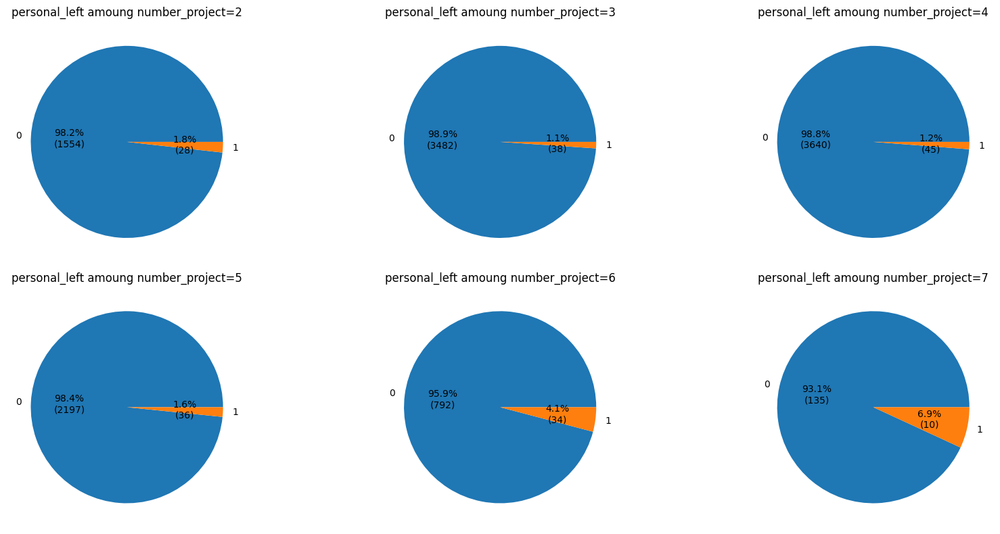

In [8]:
#######################################
#P(personal_left | number_project)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['number_project'],margins=False).reset_index()

display(result)
col_nm=df_drop['number_project'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung number_project={col}")
plt.tight_layout()
plt.show()

In [9]:
#$H_{0}$: No association between number_project and personal_left
#$H_{A}$: There is an association between number_project and personal_left
result=pd.crosstab(df_drop['number_project'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
number_project,,
2,1554,28
3,3482,38
4,3640,45
5,2197,36
6,792,34
7,135,10


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=69.06)


##### personal_left vs time_spend_company

time_spend_company,personal_left,2,3,4,5,6,7,8,10
0,0,2879,5145,1951,1012,531,94,81,107
1,1,31,45,54,50,11,0,0,0


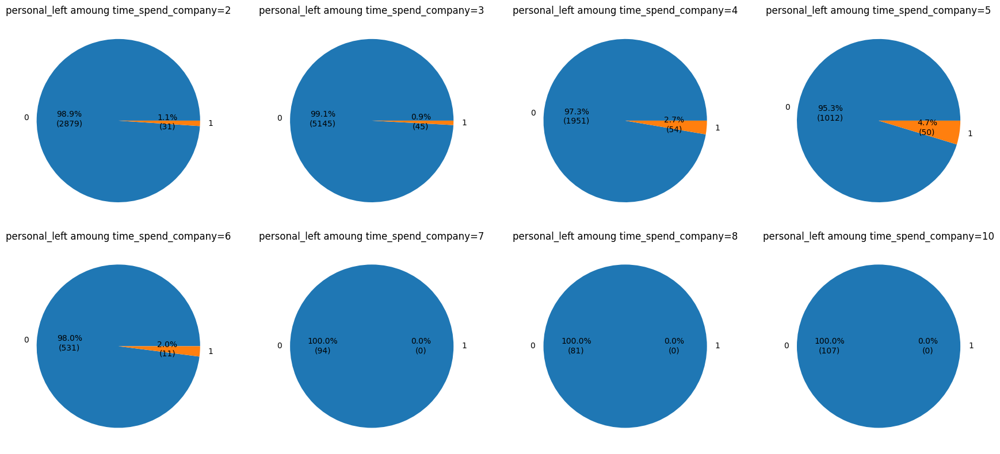

In [10]:
#######################################
#P(personal_left | time_spend_company)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['time_spend_company'],margins=False).reset_index()

display(result)
col_nm=df_drop['time_spend_company'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung time_spend_company={col}")
plt.tight_layout()
plt.show()

##### personal_left vs work_accident

work_accident,personal_left,0,1
0,0,9962,1838
1,1,179,12


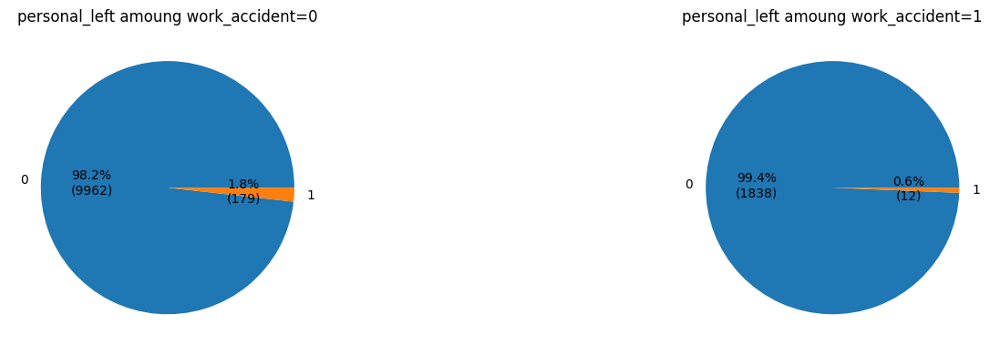

In [11]:
#######################################
#P(personal_left | work_accident)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['work_accident'],margins=False).reset_index()

display(result)
col_nm=df_drop['work_accident'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung work_accident={col}")
plt.tight_layout()
plt.show()


In [12]:
#$H_{0}$: No association between work_accident and personal_left
#$H_{A}$: There is an association between work_accident and personal_left
result=pd.crosstab(df_drop['work_accident'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
work_accident,,
0,9962,179
1,1838,12


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=12.44)


##### personal_left vs promotion_last_5years

promotion_last_5years,personal_left,0,1
0,0,11598,202
1,1,190,1


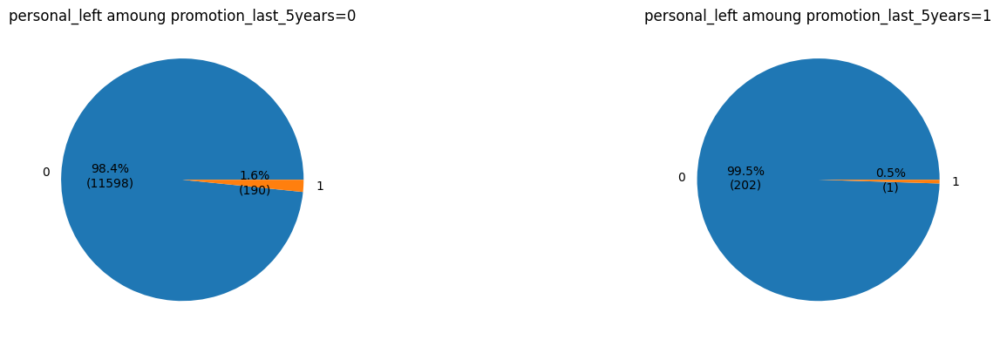

In [13]:
#######################################
#P(personal_left | promotion_last_5years)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['promotion_last_5years'],margins=False).reset_index()

display(result)
col_nm=df_drop['promotion_last_5years'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung promotion_last_5years={col}")
plt.tight_layout()
plt.show()


In [14]:
#$H_{0}$: No association between promotion_last_5years and personal_left
#$H_{A}$: There is an association between promotion_last_5years and personal_left
result=pd.crosstab(df_drop['promotion_last_5years'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
promotion_last_5years,,
0,11598,190
1,202,1


Fail to reject H0 at significance level 0.01 (Pvalue=0.207, Statistic=1.59)


##### personal_left vs department

department,personal_left,IT,RandD,accounting,hr,management,marketing,product_mng,sales,support,technical
0,0,965,683,610,589,429,665,678,3191,1790,2200
1,1,11,11,11,12,7,8,8,48,31,44


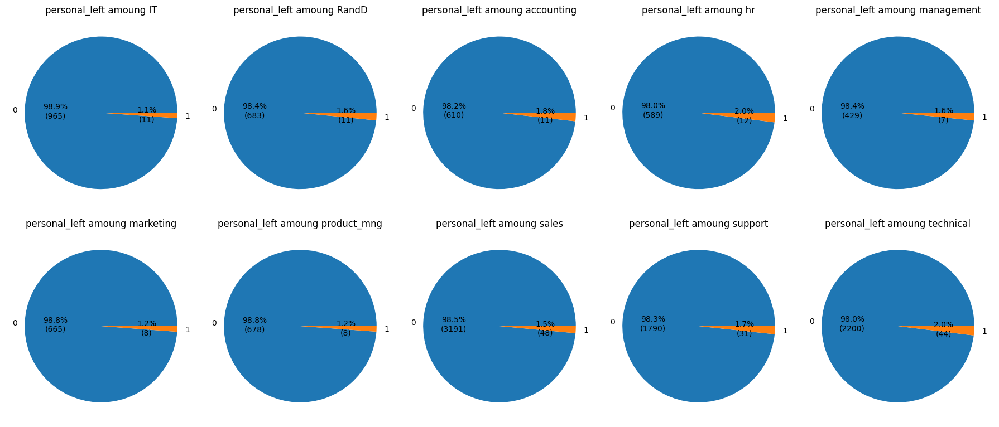

In [15]:
#######################################
#P(personal_left | department)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['department'],margins=False).reset_index()

display(result)
col_nm=df_drop['department'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung {col}")
plt.tight_layout()
plt.show()

In [16]:
#$H_{0}$: No association between department and personal_left
#$H_{A}$: There is an association between department and personal_left
result=pd.crosstab(df_drop['department'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
department,,
IT,965,11
RandD,683,11
accounting,610,11
hr,589,12
management,429,7
marketing,665,8
product_mng,678,8
sales,3191,48
support,1790,31


Fail to reject H0 at significance level 0.01 (Pvalue=0.747, Statistic=5.93)


personal_left,department,0,1
0,IT,965,11
1,RandD,683,11
2,accounting,610,11
3,hr,589,12
4,management,429,7
5,marketing,665,8
6,product_mng,678,8
7,sales,3191,48
8,support,1790,31
9,technical,2200,44


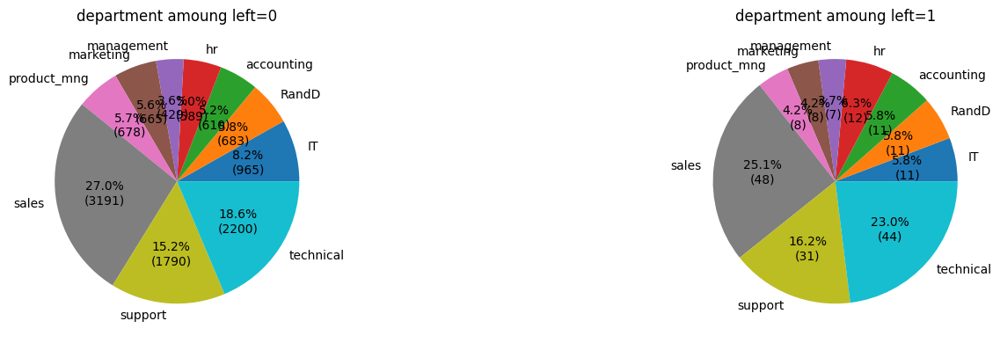

In [17]:
#######################################
#P(department | personal_left)
#######################################
result=pd.crosstab(df_drop['department'],df_drop['personal_left'],margins=False).reset_index()

display(result)
col_nm=df_drop['personal_left'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["department"], autopct=autopct_format(result[col]))
    ax.set_title(f"department amoung left={col}")
plt.tight_layout()
plt.show()

##### personal_left vs salary

salary,personal_left,low,medium,high
0,0,5624,5191,985
1,1,116,70,5


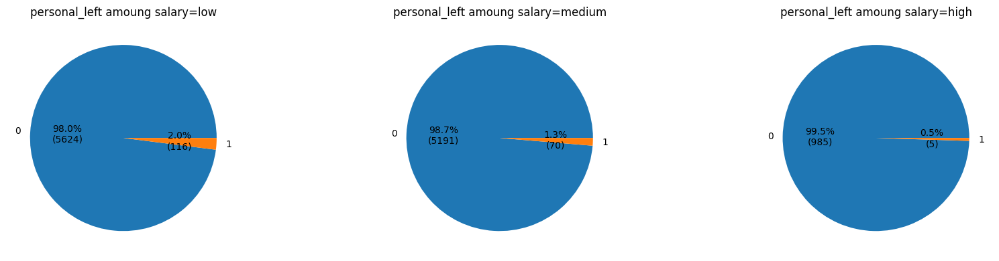

In [18]:
#######################################
#P(personal_left | salary)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['salary'],margins=False).reset_index()

display(result)
col_nm=df_drop['salary'].unique().tolist()

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung salary={col}")
plt.tight_layout()
plt.show()

In [19]:
#$H_{0}$: No association between salary and personal_left
#$H_{A}$: There is an association between salary and personal_left
result=pd.crosstab(df_drop['salary'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
salary,,
low,5624,116
medium,5191,70
high,985,5


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=16.49)


In [20]:
#post hoc test for proportion 

#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_ztest.html
#$H_{0}$: promoted proportion of two compared salary were identical
#$H_{A}$: promoted proportion of two compared salary were not identical
significance_level=0.01

print('proportions_ztest test result of personal_left')
results = {}
cal_result=pd.crosstab(df_drop['salary'], df_drop['personal_left']).reset_index()
cal_result['All']=cal_result[0]+cal_result[1]
display(cal_result)

for i, item1 in enumerate(sorted(cal_result['salary'].unique().tolist())):
    for j, item2 in enumerate(sorted(cal_result['salary'].unique().tolist())):
        if i < j:
            
            statistic, pvalue = proportions_ztest(cal_result[cal_result['salary'].isin([item1,item2])][1],
                                                 cal_result[cal_result['salary'].isin([item1,item2])]['All'])
            if pvalue<=significance_level:
                result='Reject H0'
            else:
                result='Fail reject'
            results[f"{item1} vs {item2}"] = (statistic, pvalue ,result)

# Convert the results into a DataFrame
result_df = pd.DataFrame(results).transpose()
result_df.columns = ['Statistic', 'Pvalue','Result']
result_df.reset_index(inplace=True)
result_df.rename(columns={'index': 'salary_compared'}, inplace=True)

result_df
#=>low salary different from medium and high

proportions_ztest test result of personal_left


personal_left,salary,0,1,All
0,low,5624,116,5740
1,medium,5191,70,5261
2,high,985,5,990


,salary_compared,Statistic,Pvalue,Result
0,high vs low,3.31496,0.000917,Reject H0
1,high vs medium,2.188551,0.028629,Fail reject
2,low vs medium,2.805513,0.005024,Reject H0


##### personal_left vs satisfaction_level

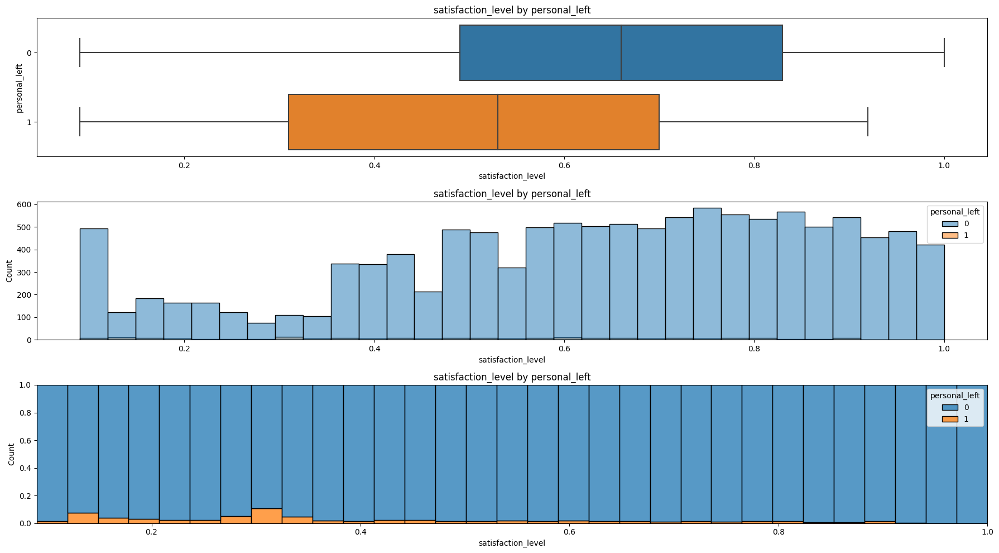

,personal_left,min,max,std,mean,median,count
0,0,0.09,1.00,0.240606,0.631703,0.66,11800
1,1,0.09,0.92,0.236655,0.503351,0.53,191


In [21]:
#############################################
#satisfaction_level and personal_left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by personal_left')

sns.histplot(data=df_drop,hue=df_drop['personal_left'].astype(str),x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by personal_left')

sns.histplot(data=df_drop,hue=df_drop['personal_left'].astype(str),x='satisfaction_level',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('satisfaction_level by personal_left')


plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())


In [22]:
# Levene test for equal variances.
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.levene.html
#H0:All input samples are from populations with equal variances
#HA:At least one input sample are from populations with different variance
significance_level=0.01
print('Levene test result of satisfaction_level')
statistic, p_value = levene(*[df_drop['satisfaction_level'][df_drop['personal_left'] == item]
                                    for item in df_drop['personal_left'].unique()])
show_test_result(statistic, p_value,significance_level)

Levene test result of satisfaction_level
Fail to reject H0 at significance level 0.01 (Pvalue=0.582, Statistic=0.3)


In [23]:
# Kruskal-Wallis test
#H0:The population median of all of the groups are equal
#HA:At least one group has different median
significance_level=0.01
print('Kruskal-Wallis test result of satisfaction_level')
statistic, p_value = kruskal(*[df_drop['satisfaction_level'][df_drop['personal_left'] == item]
                                    for item in df_drop['personal_left'].unique()])
show_test_result(statistic, p_value,significance_level)

Kruskal-Wallis test result of satisfaction_level
Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=51.58)


In [24]:
# Mann-Whitney U rank test
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html
#H0:The population median of left employee great equal than employee who didn't leave
#HA:The population median of left employee less than employee who didn't leave
significance_level=0.01
print('Mann-Whitney test result of satisfaction_level')
statistic, p_value = mannwhitneyu(df_drop[df_drop['personal_left']==1]['satisfaction_level'], 
                                  df_drop[df_drop['personal_left']==0]['satisfaction_level'],
                                  alternative="less")
show_test_result(statistic, p_value,significance_level)

Mann-Whitney test result of satisfaction_level
Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=786089.5)


##### personal_left vs last_evaluation

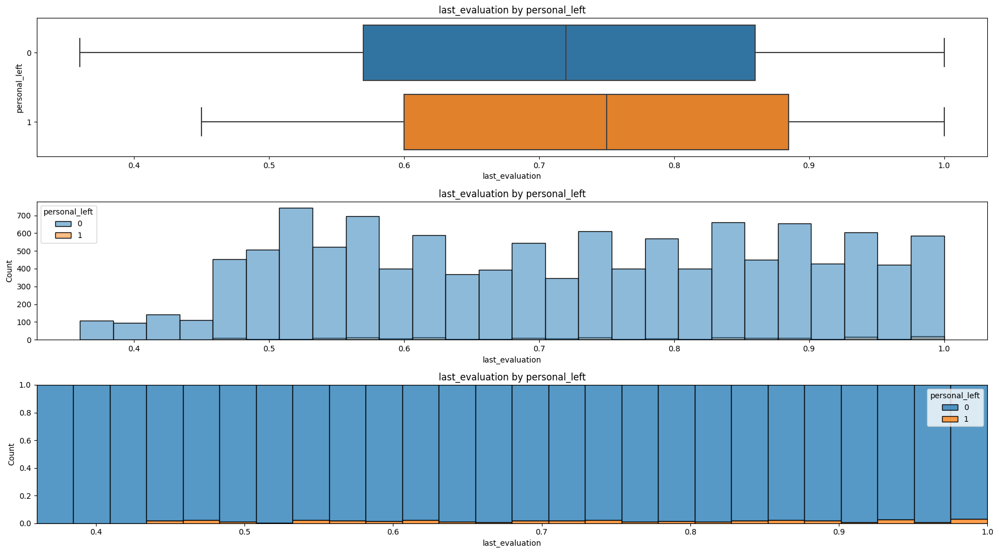

,personal_left,min,max,std,mean,median,count
0,0,0.36,1.0,0.168335,0.716234,0.72,11800
1,1,0.45,1.0,0.166943,0.744398,0.75,191


In [25]:
#############################################
#last_evaluation and left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='last_evaluation',ax=axs[0])
axs[0].set_title('last_evaluation by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='last_evaluation',palette='tab10',ax=axs[1])
axs[1].set_title('last_evaluation by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='last_evaluation',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('last_evaluation by personal_left')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['last_evaluation'].agg(['min','max','std','mean','median','count']).reset_index())

In [26]:
# Mann-Whitney U rank test
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html
#H0:The population median of left employee less equal than employee who didn't leave
#HA:The population median of left employee greater than employee who didn't leave
significance_level=0.01
print('Mann-Whitney test result of last_evaluation')
statistic, p_value = mannwhitneyu(df_drop[df_drop['personal_left']==1]['last_evaluation'], 
                                  df_drop[df_drop['personal_left']==0]['last_evaluation'],
                                  alternative="greater")
show_test_result(statistic, p_value,significance_level)

Mann-Whitney test result of last_evaluation
Fail to reject H0 at significance level 0.01 (Pvalue=0.012, Statistic=1233667.5)


#####  personal_left vs average_monthly_hours

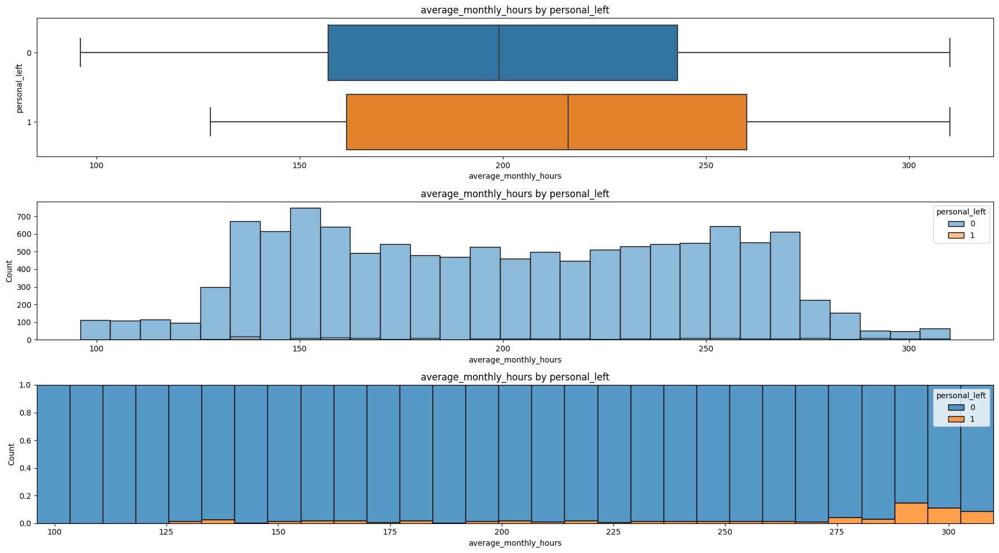

,personal_left,min,max,std,mean,median,count
0,0,96,310,48.595433,200.252034,199.0,11800
1,1,128,310,54.733002,214.157068,216.0,191


In [27]:
#############################################
#average_monthly_hours and personal_left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='average_monthly_hours',ax=axs[0])
axs[0].set_title('average_monthly_hours by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',ax=axs[1])
axs[1].set_title('average_monthly_hours by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('average_monthly_hours by personal_left')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['average_monthly_hours'].agg(['min','max','std','mean','median','count']).reset_index())


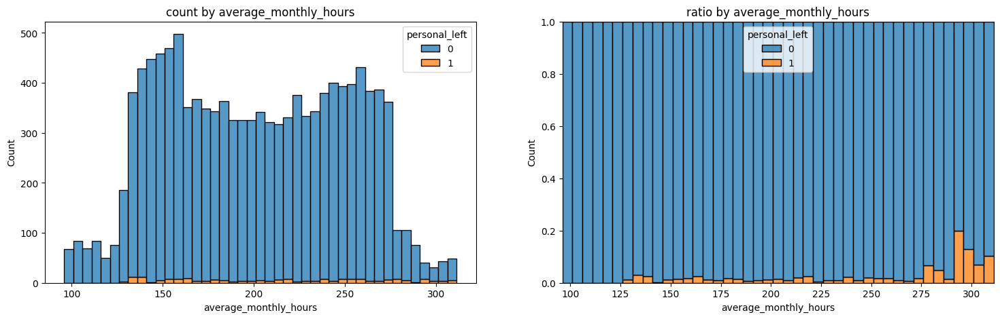

In [28]:
#############################################
#Histplot of average_monthly_hours
#############################################
fig, axs = plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='stack',binwidth=5,ax=axs[0])
axs[0].set_title('count by average_monthly_hours')
sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='fill',binwidth=5,ax=axs[1])
axs[1].set_title('ratio by average_monthly_hours')
plt.show()

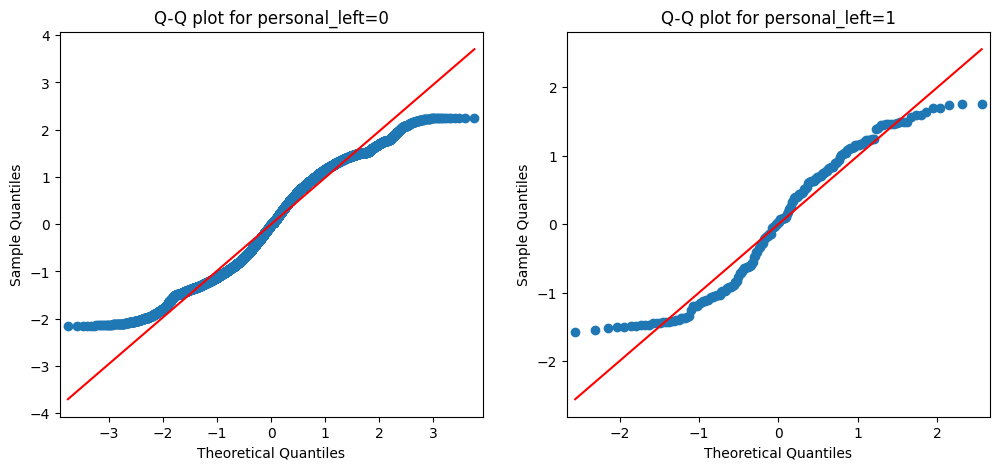

In [29]:
####################################################
#Q-Q plot
####################################################
from scipy.stats import norm
fig, axs = plt.subplots(1,2,figsize=(12,5))

qq = sm.qqplot(df_drop[df_drop['personal_left']==0]['average_monthly_hours'], norm,fit=True,line="r",ax=axs[0])
axs[0].set_title(f"Q-Q plot for personal_left=0")
qq = sm.qqplot(df_drop[df_drop['personal_left']==1]['average_monthly_hours'], norm,fit=True,line="r",ax=axs[1])
axs[1].set_title(f"Q-Q plot for personal_left=1")

plt.show()

In [30]:
from scipy.stats import bootstrap

data1 = (df_drop[df_drop['personal_left']==0]['average_monthly_hours'],) 
res1 = bootstrap(data1, np.mean, confidence_level=0.95,alternative='two-sided', method='BCa',random_state=7)
print(res1.confidence_interval)

data2 = (df_drop[df_drop['personal_left']==1]['average_monthly_hours'],) 
res2 = bootstrap(data2, np.mean, confidence_level=0.95,alternative='two-sided', method='BCa',random_state=7)
print(res2.confidence_interval)

ConfidenceInterval(low=199.37637492290176, high=201.10355025351285)
ConfidenceInterval(low=206.18501593642262, high=221.88356779962004)


In [31]:
percentile_bootstrap_ci(df_drop[df_drop['personal_left']==0]['average_monthly_hours'],np.median)

(198.0, 201.0, array([200., 199., 198., ..., 199., 201., 201.]))

average_monthly_hours_range,left,"[0,125]","(125,160]","(160,200]","(200,240]","(240,280]","(280,inf)"
0,0,428,2001,2706,2530,2240,95
1,1,0,866,44,213,620,248


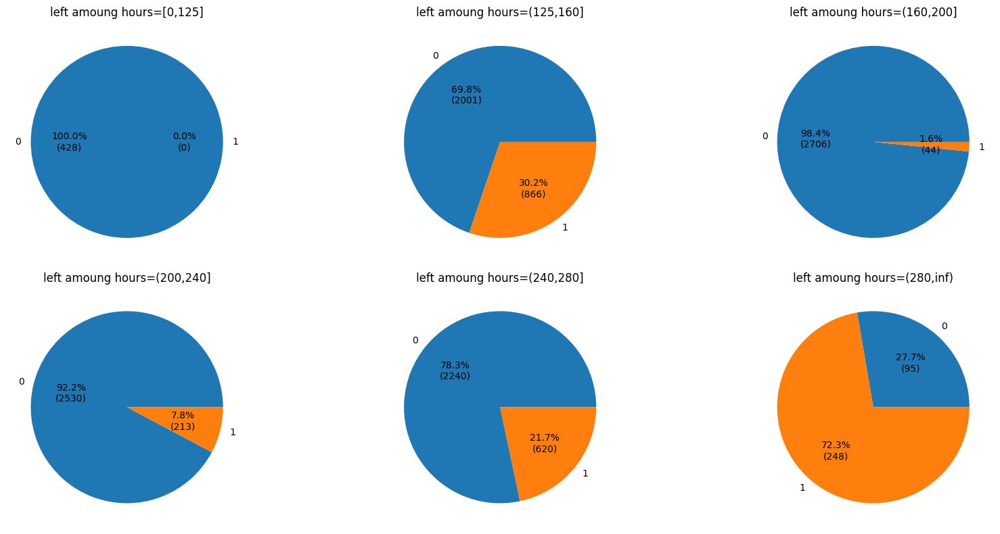

In [32]:
#######################################
#P(left | average_monthly_hours_range)
#######################################
result=pd.crosstab(df_drop['left'],df_drop['average_monthly_hours_range'],margins=False).reset_index()

display(result)
#col_nm=df_drop['average_monthly_hours_range'].unique().tolist()
col_nm=average_monthly_hours_range_order

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["left"], autopct=autopct_format(result[col]))
    ax.set_title(f"left amoung hours={col}")
plt.tight_layout()
plt.show()

average_monthly_hours_range,personal_left,"[0,125]","(125,160]","(160,200]","(200,240]","(240,280]","(280,inf)"
0,0,428,2822,2714,2705,2814,317
1,1,0,45,36,38,46,26


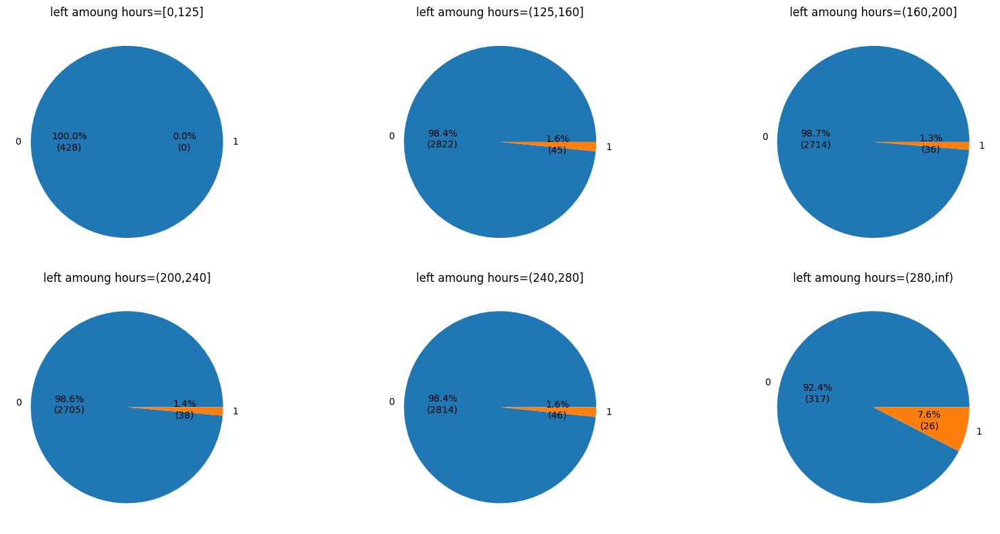

In [33]:
#######################################
#P(personal_left | average_monthly_hours_range)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['average_monthly_hours_range'],margins=False).reset_index()

display(result)
#col_nm=df_drop['average_monthly_hours_range'].unique().tolist()
col_nm=average_monthly_hours_range_order

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"left amoung hours={col}")
plt.tight_layout()
plt.show()

#### Confirm satisfaction_level

##### satisfaction_level vs number_project

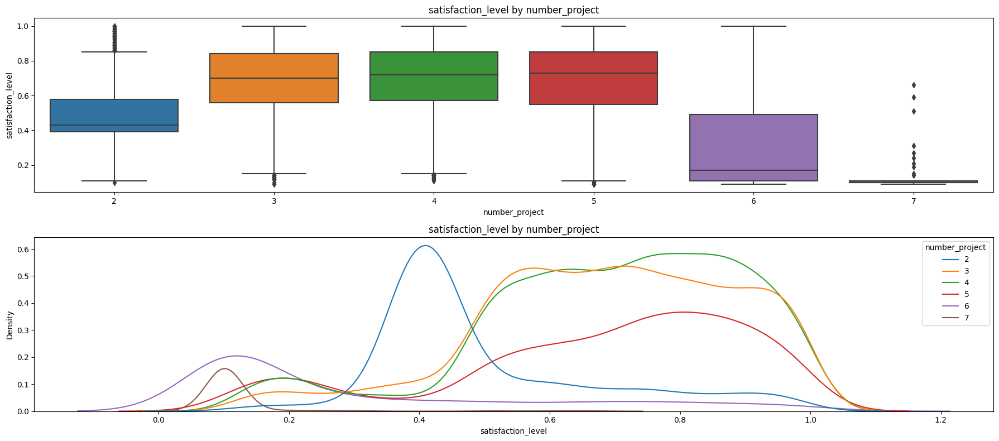

,number_project,min,max,std,mean,median,count
0,2,0.10,1.00,0.175465,0.499071,0.43,1582
1,3,0.09,1.00,0.195010,0.689418,0.70,3520
2,4,0.11,1.00,0.201637,0.694280,0.72,3685
3,5,0.09,1.00,0.235028,0.671155,0.73,2233
4,6,0.09,1.00,0.273092,0.314673,0.17,826
5,7,0.09,0.66,0.074806,0.116690,0.10,145


In [34]:
#############################################
#satisfaction_level and number_project
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,x='number_project',y='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by number_project')

sns.kdeplot(data=df_drop,hue='number_project',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by number_project')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['number_project'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

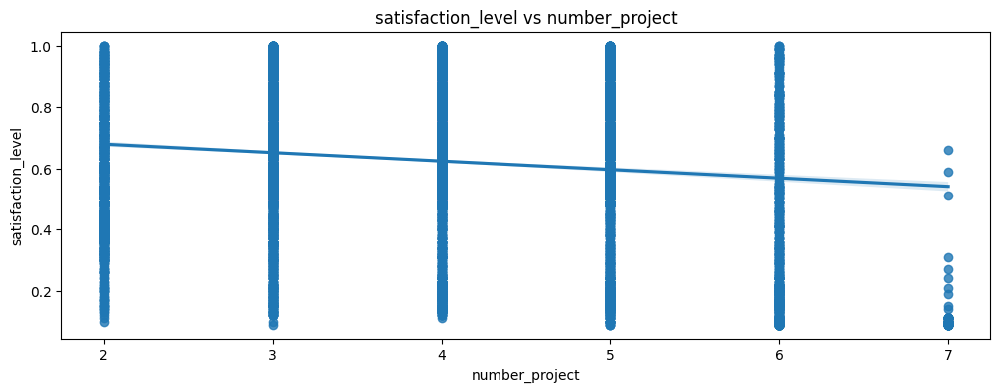

In [35]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="number_project", y="satisfaction_level")
plt.title('satisfaction_level vs number_project')
plt.show()

#####  satisfaction_level vs time_spend_company

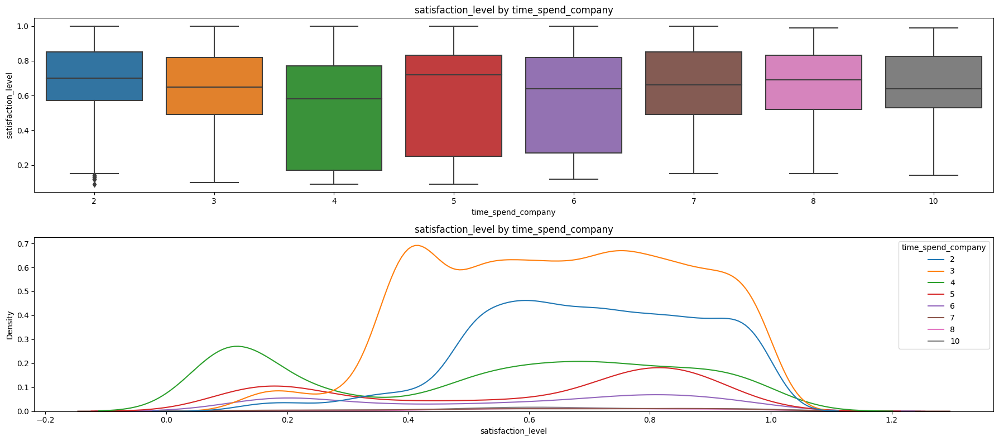

,time_spend_company,min,max,std,mean,median,count
0,2,0.09,1.00,0.184041,0.699165,0.70,2910
1,3,0.10,1.00,0.205101,0.648988,0.65,5190
2,4,0.09,1.00,0.307492,0.516090,0.58,2005
3,5,0.09,1.00,0.287610,0.583183,0.72,1062
4,6,0.12,1.00,0.279597,0.571107,0.64,542
5,7,0.15,1.00,0.245043,0.635957,0.66,94
6,8,0.15,0.99,0.212727,0.665062,0.69,81
7,10,0.14,0.99,0.218340,0.655327,0.64,107


In [36]:
#############################################
#satisfaction_level and time_spend_company
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,x='time_spend_company',y='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by time_spend_company')

sns.kdeplot(data=df_drop,hue='time_spend_company',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by time_spend_company')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['time_spend_company'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

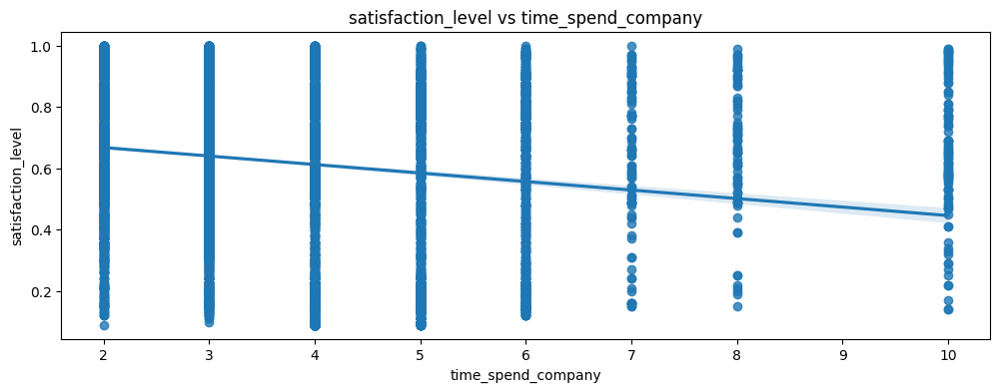

In [37]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="time_spend_company", y="satisfaction_level")
plt.title('satisfaction_level vs time_spend_company')
plt.show()

#####  satisfaction_level vs work_accident

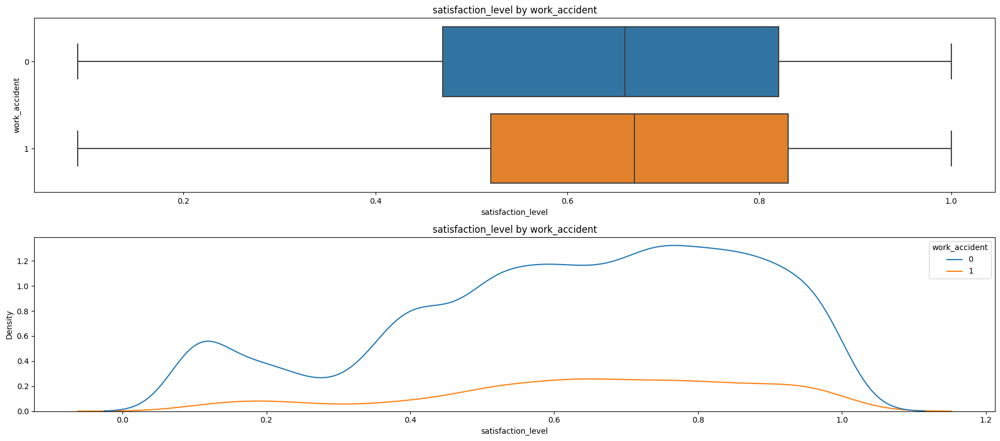

,work_accident,min,max,std,mean,median,count
0,0,0.09,1.0,0.243176,0.625546,0.66,10141
1,1,0.09,1.0,0.227933,0.652200,0.67,1850


In [38]:
#############################################
#satisfaction_level and work_accident
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,y=df_drop['work_accident'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by work_accident')

sns.kdeplot(data=df_drop,hue='work_accident',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by work_accident')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['work_accident'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

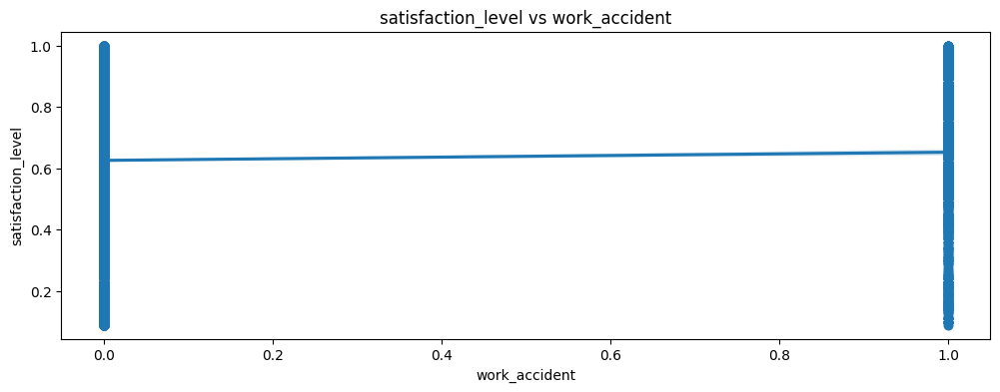

In [39]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="work_accident", y="satisfaction_level")
plt.title('satisfaction_level vs work_accident')
plt.show()

#####  satisfaction_level vs promotion_last_5years

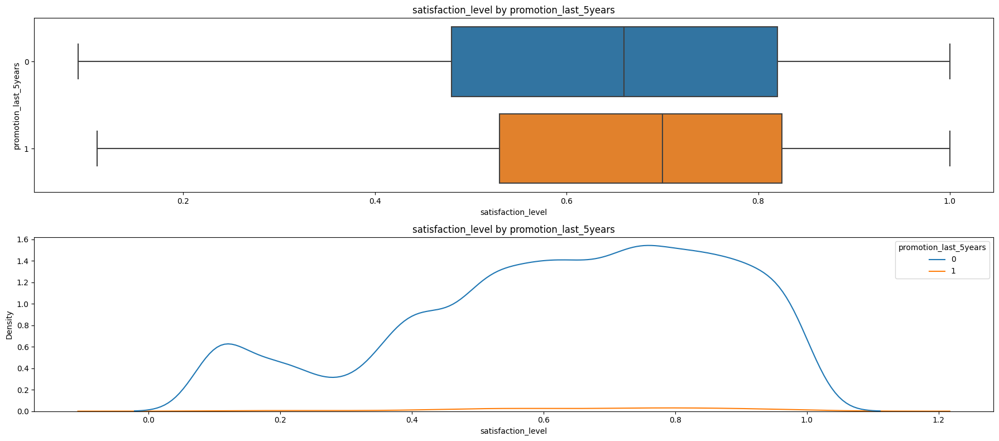

,promotion_last_5years,min,max,std,mean,median,count
0,0,0.09,1.0,0.241538,0.629032,0.66,11788
1,1,0.11,1.0,0.209470,0.666010,0.70,203


In [40]:
#############################################
#satisfaction_level and promotion_last_5years
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,y=df_drop['promotion_last_5years'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by promotion_last_5years')

sns.kdeplot(data=df_drop,hue='promotion_last_5years',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by promotion_last_5years')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['promotion_last_5years'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

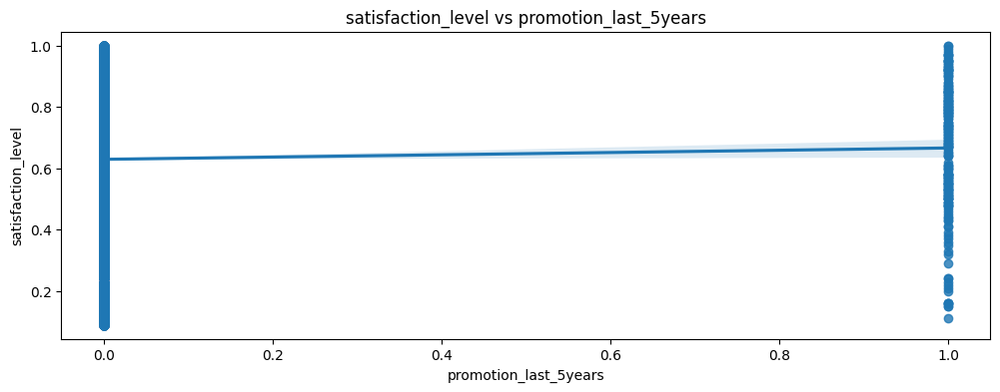

In [41]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="promotion_last_5years", y="satisfaction_level")
plt.title('satisfaction_level vs promotion_last_5years')
plt.show()

#####  satisfaction_level vs department

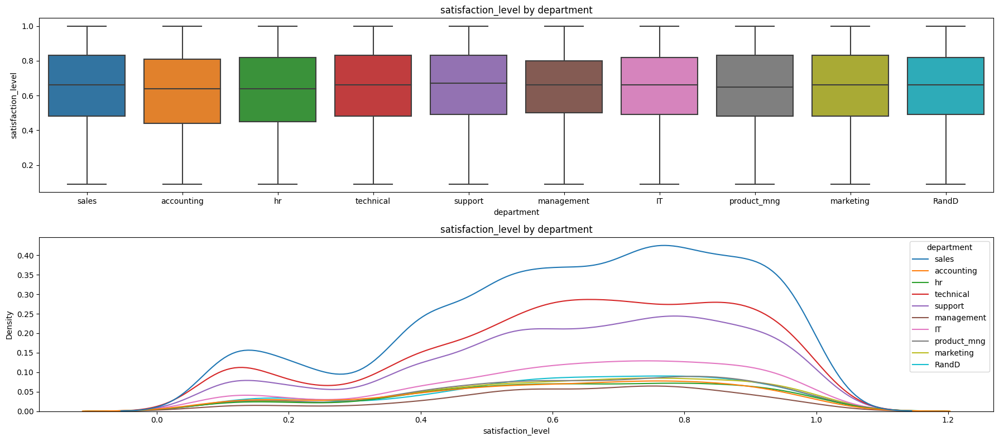

,department,min,max,std,mean,median,count
0,IT,0.09,1.0,0.239337,0.634016,0.66,976
1,RandD,0.09,1.0,0.240247,0.627176,0.66,694
2,accounting,0.09,1.0,0.244739,0.607939,0.64,621
3,hr,0.09,1.0,0.241492,0.621947,0.64,601
4,management,0.09,1.0,0.222921,0.631995,0.66,436
5,marketing,0.09,1.0,0.239505,0.634770,0.66,673
6,product_mng,0.09,1.0,0.238201,0.629825,0.65,686
7,sales,0.09,1.0,0.242549,0.631349,0.66,3239
8,support,0.09,1.0,0.240060,0.634822,0.67,1821
9,technical,0.09,1.0,0.244399,0.627937,0.66,2244


In [42]:
#############################################
#satisfaction_level and department
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,x='department',y='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by department')

sns.kdeplot(data=df_drop,hue='department',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by department')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['department'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

#####  satisfaction_level vs salary

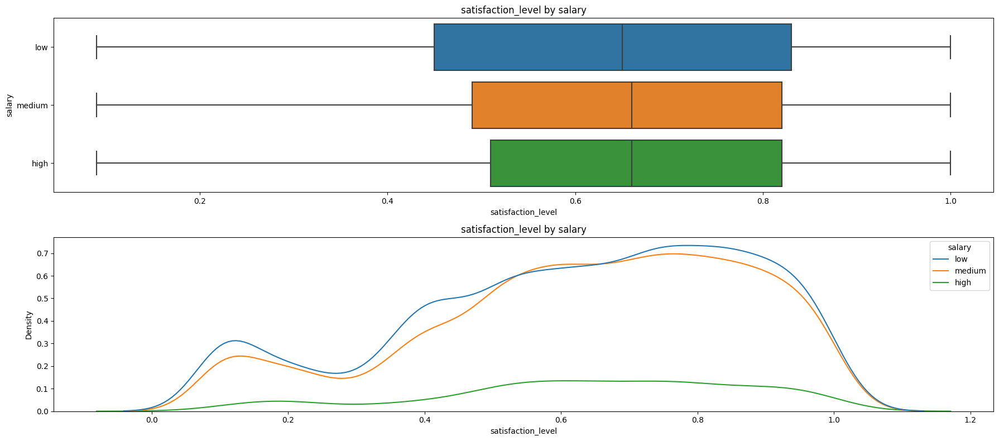

,salary,min,max,std,mean,median,count
0,low,0.09,1.0,0.246637,0.622655,0.65,5740
1,medium,0.09,1.0,0.237343,0.634723,0.66,5261
2,high,0.09,1.0,0.226611,0.643343,0.66,990


In [43]:
#############################################
#satisfaction_level and salary
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,y=df_drop['salary'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by salary')

sns.kdeplot(data=df_drop,hue='salary',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by salary')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['salary'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

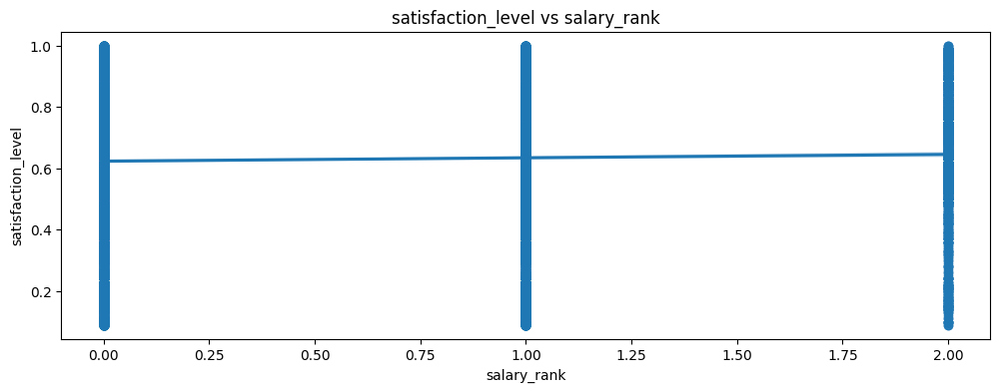

In [44]:
df_drop['salary_rank']=df_drop['salary'].cat.codes
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="salary_rank", y="satisfaction_level")
plt.title('satisfaction_level vs salary_rank')
plt.show()

#####  satisfaction_level vs last_evaluation

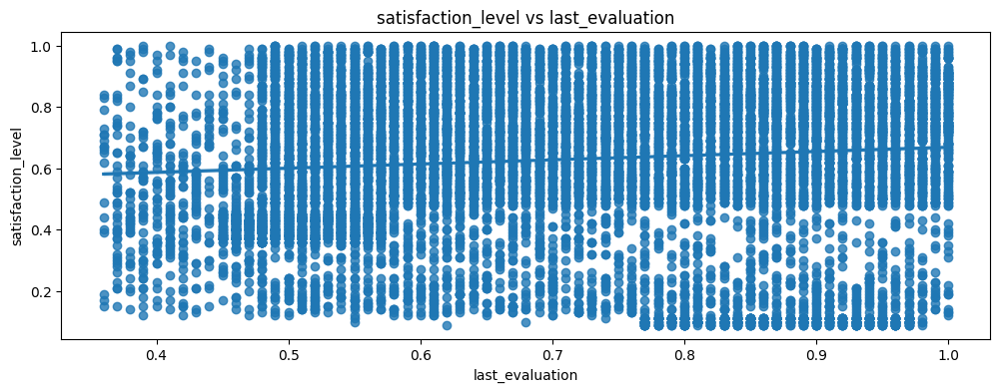

In [45]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="last_evaluation", y="satisfaction_level")
plt.title('satisfaction_level vs last_evaluation')
plt.show()

evaluation_range,left,"(0.2,0.4]","(0.4,0.6]","(0.6,0.8]","(0.8,1]"
0,0,201,2742,3733,3324
1,1,0,880,150,961


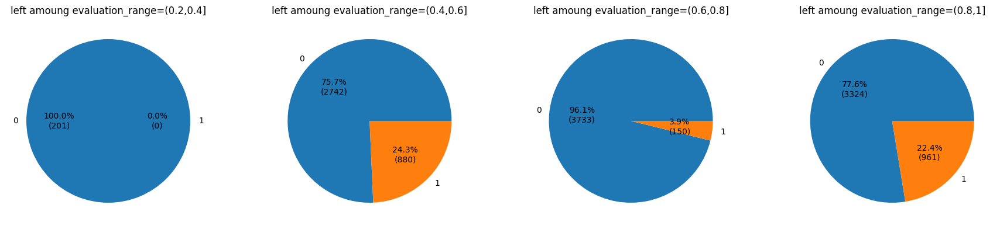

In [46]:
#######################################
#P(left | evaluation_range)
#######################################
result=pd.crosstab(df_drop['left'],df_drop['evaluation_range'],margins=False).reset_index()

display(result)
col_nm=df_drop['evaluation_range'].unique().tolist()
col_nm.sort(key=evaluation_range_order.index)
#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["left"], autopct=autopct_format(result[col]))
    ax.set_title(f"left amoung evaluation_range={col}")
plt.tight_layout()
plt.show()

evaluation_range,personal_left,"(0.2,0.4]","(0.4,0.6]","(0.6,0.8]","(0.8,1]"
0,0,201,3571,3822,4206
1,1,0,51,61,79


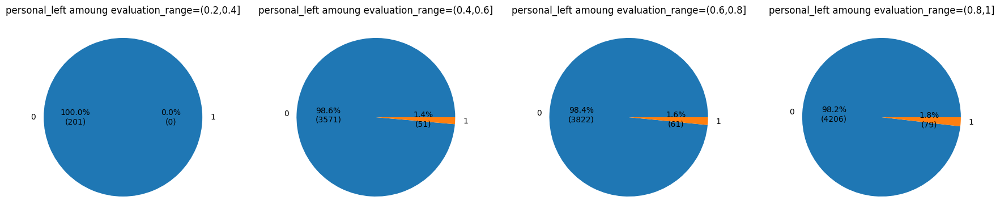

In [47]:
#######################################
#P(personal_left | evaluation_range)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['evaluation_range'],margins=False).reset_index()

display(result)
col_nm=df_drop['evaluation_range'].unique().tolist()
col_nm.sort(key=evaluation_range_order.index)

#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung evaluation_range={col}")
plt.tight_layout()
plt.show()

#####  satisfaction_level vs average_monthly_hours

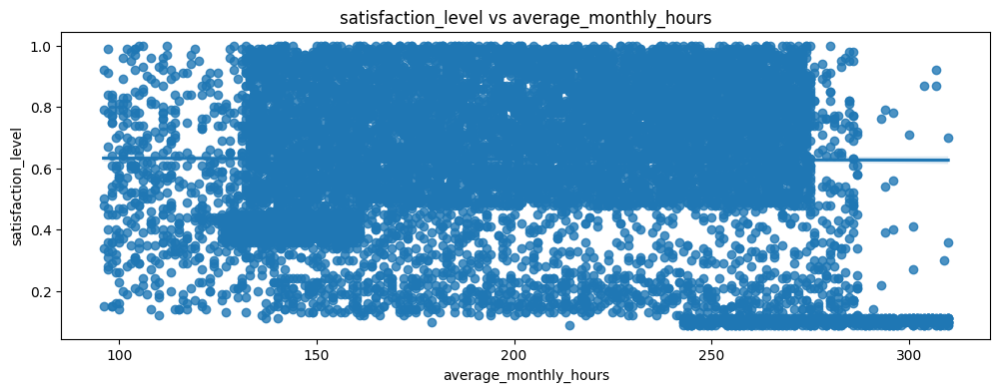

In [48]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="average_monthly_hours", y="satisfaction_level")
plt.title('satisfaction_level vs average_monthly_hours')
plt.show()

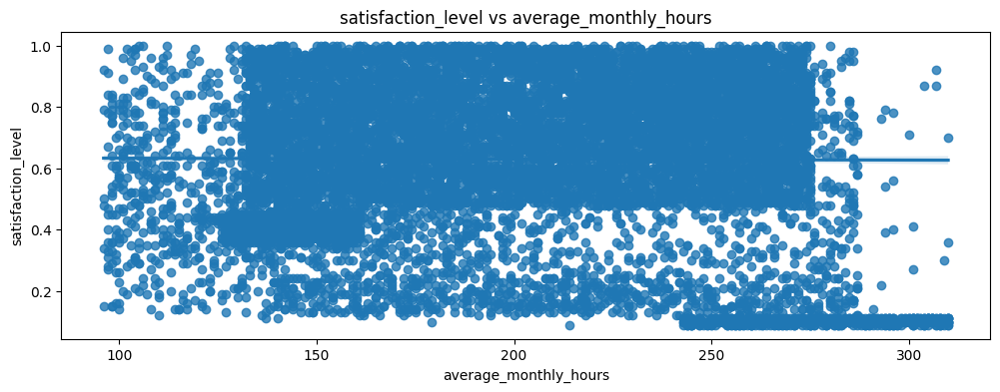

In [49]:
plt.figure(figsize=(12,4))
sns.regplot(data=df_drop, x="average_monthly_hours", y="satisfaction_level")
plt.title('satisfaction_level vs average_monthly_hours')
plt.show()

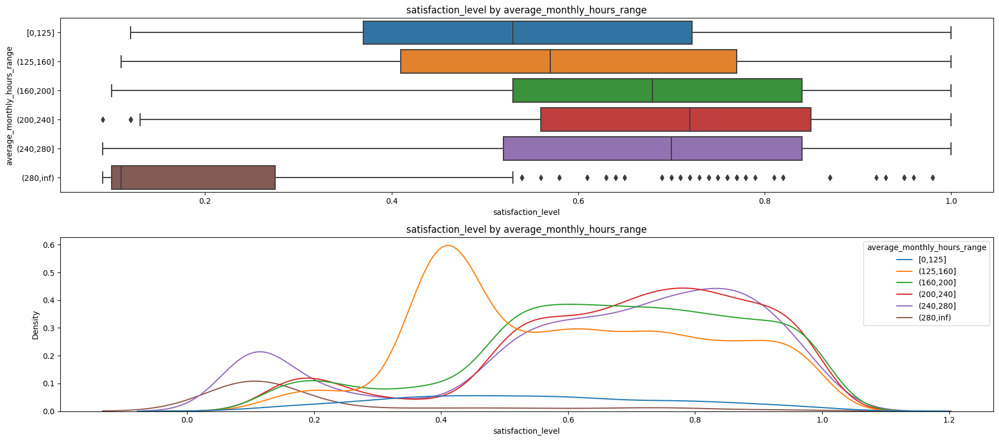

,average_monthly_hours_range,min,max,std,mean,median,count
0,"[0,125]",0.12,1.00,0.222008,0.545491,0.53,428
1,"(125,160]",0.11,1.00,0.215248,0.592047,0.57,2867
2,"(160,200]",0.10,1.00,0.217557,0.665273,0.68,2750
3,"(200,240]",0.09,1.00,0.213453,0.686854,0.72,2743
4,"(240,280]",0.09,1.00,0.261846,0.637836,0.70,2860
5,"(280,inf)",0.09,0.98,0.238917,0.237930,0.11,343


In [50]:
#############################################
#satisfaction_level and average_monthly_hours_range
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,y=df_drop['average_monthly_hours_range'],x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by average_monthly_hours_range')

sns.kdeplot(data=df_drop,hue='average_monthly_hours_range',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by average_monthly_hours_range')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['average_monthly_hours_range'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

#work hour [0,125], (125,160], (160,200], (200,240] it looks longer average_monthly_hours_range, higher median satisfaction_level
#work hour (240,280], (280,inf), longer average_monthly_hours_range, lower median satisfaction_level

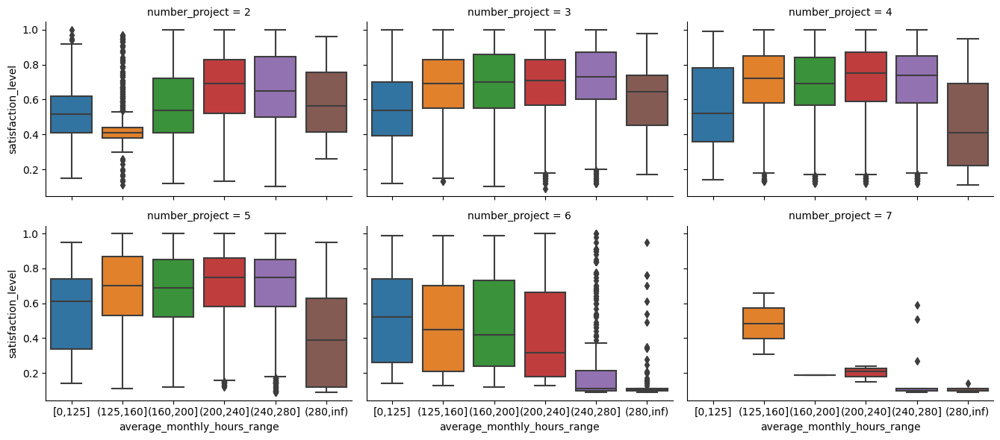

In [51]:
#############################################
#satisfaction_level by average_monthly_hours_range
#keep number_project constant
#############################################
sns.catplot(
    data=df_drop, x='average_monthly_hours_range',y="satisfaction_level",  col="number_project",
    kind="box", height=3, aspect=1.5, col_wrap=3
)
plt.show()

In [52]:
df_drop['time_spend_company'].value_counts()

time_spend_company
3     5190
2     2910
4     2005
5     1062
6      542
10     107
7       94
8       81
Name: count, dtype: int64

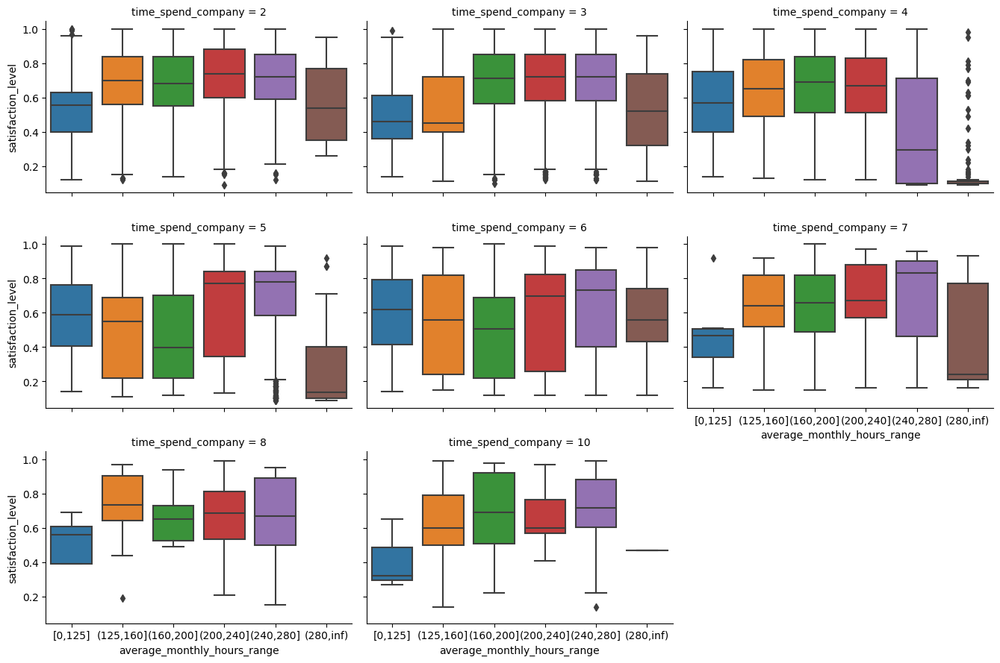

In [53]:
#############################################
#satisfaction_level by average_monthly_hours_range
#keep time_spend_company constant
#############################################
sns.catplot(
    data=df_drop, x='average_monthly_hours_range',y="satisfaction_level",  col="time_spend_company",
    kind="box", height=3, aspect=1.5, col_wrap=3
)
plt.show()

##### satisfaction_level vs emp_type

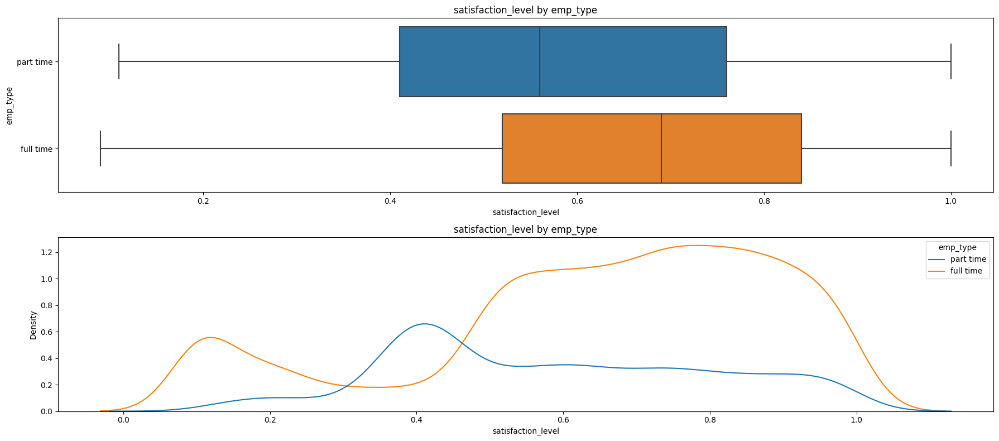

,emp_type,min,max,std,mean,median,count
0,full time,0.09,1.0,0.247703,0.646201,0.69,8696
1,part time,0.11,1.0,0.216670,0.586000,0.56,3295


In [54]:
#############################################
#satisfaction_level and salary
#############################################
fig, axs = plt.subplots(2,1,figsize=(18,8))

sns.boxplot(data=df_drop,y=df_drop['emp_type'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by emp_type')

sns.kdeplot(data=df_drop,hue='emp_type',x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by emp_type')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['emp_type'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())

#### Identify correlations

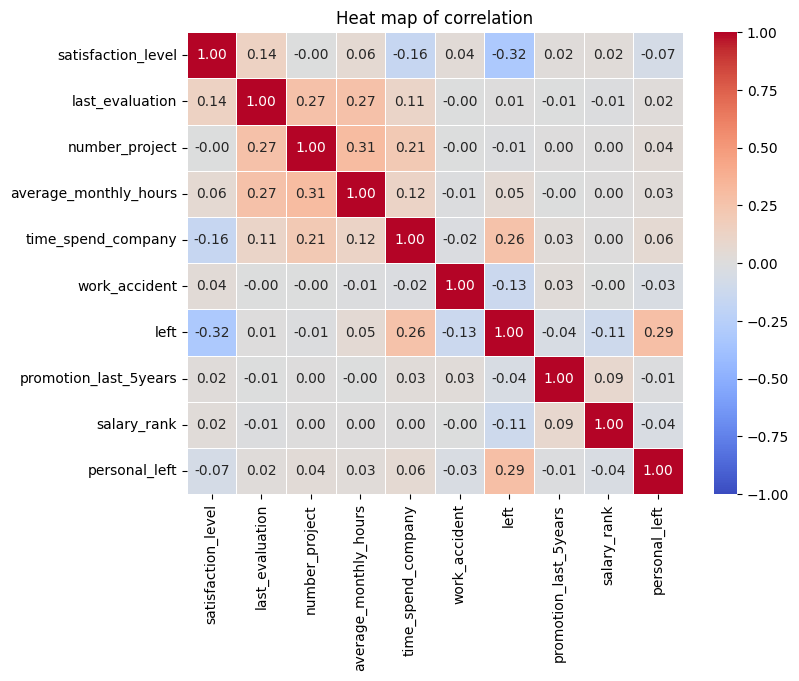

In [55]:
plt.figure(figsize=(8,6))
number_cols=['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident', 'left',
       'promotion_last_5years', 'salary_rank', 
       'personal_left',]
df_heatmap = df_drop[number_cols].corr(method='spearman')
sns.heatmap(df_heatmap,annot=True, vmin=-1, vmax=1,cmap="coolwarm", linewidth=.5,fmt='.2f')
plt.title('Heat map of correlation')
plt.show()

## Build models


### Modeling

In [56]:
target_columns=[
       'satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident', 'left',
       'promotion_last_5years', 'department', 'salary','emp_type','personal_left'
               ]
df_sample=df_drop[target_columns]
df_sample['department_trans']=df_sample['department']
df_sample=pd.get_dummies(df_sample,columns=['department_trans'], prefix_sep='_', dtype=bool, prefix=None)
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   satisfaction_level            11991 non-null  float64 
 1   last_evaluation               11991 non-null  float64 
 2   number_project                11991 non-null  int64   
 3   average_monthly_hours         11991 non-null  int64   
 4   time_spend_company            11991 non-null  int64   
 5   work_accident                 11991 non-null  int64   
 6   left                          11991 non-null  int64   
 7   promotion_last_5years         11991 non-null  int64   
 8   department                    11991 non-null  object  
 9   salary                        11991 non-null  category
 10  emp_type                      11991 non-null  object  
 11  personal_left                 11991 non-null  int64   
 12  department_trans_IT           11991 non-null  

In [57]:
#confirm proportion of left employees
display(df_sample['left'].value_counts(normalize=True))

left
0    0.833959
1    0.166041
Name: proportion, dtype: float64

In [58]:
#confirm proportion of personal_left employees
display(df_sample['personal_left'].value_counts(normalize=True))

#=>very imbalanced dataset

personal_left
0    0.984071
1    0.015929
Name: proportion, dtype: float64

In [59]:
######################################################
#Dummy encoding
######################################################
df_dummy=df_sample.copy()

#confirm after update
df_dummy.info()

#**************************#
#Confirm column names
#**************************#
#check object type and see if any object columns+'_' exists in other columns(e.g. RatecodeID and RatecodeID_XXXX NG)
#get columns which could be convert into dummy/indicator variables
trans_dummy_variables=list(df_dummy.select_dtypes(include=[object,'category']).columns)

#get columns which could not be convert into dummy/indicator variables
not_trans_dummy_variables=list(df_dummy.select_dtypes(exclude=[object,'category']).columns)

#after dummy encoding, their column name would be XXXX->XXXX_YYYY1,XXXX_YYYY2....
#get_fit_features will not work correctly if both XXXX and XXXX_?(Not columns after dummy encoding)(? means any word) exist
if len(trans_dummy_variables)+len(not_trans_dummy_variables)!=len(df_dummy.columns):
    raise Exception("Data type incorrect, please check again")
if not (set(trans_dummy_variables).union(set(not_trans_dummy_variables))==set(df_dummy.columns)):
    raise Exception("Data type incorrect, please check again")
print(trans_dummy_variables)
dummy_prefix_sep='_dummy_'
duplicate_flg=False

for dummy_col in trans_dummy_variables:
    for not_trans_col in not_trans_dummy_variables:
        if (dummy_col+dummy_prefix_sep) in not_trans_col:
            duplicate_flg=True
if duplicate_flg==True:
    raise Exception("Dummy variable columns duplicated with others, please update column names")


# Convert categoricals to binary
df_dummy=pd.get_dummies(df_dummy,columns=['department', 'salary','emp_type'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   satisfaction_level            11991 non-null  float64 
 1   last_evaluation               11991 non-null  float64 
 2   number_project                11991 non-null  int64   
 3   average_monthly_hours         11991 non-null  int64   
 4   time_spend_company            11991 non-null  int64   
 5   work_accident                 11991 non-null  int64   
 6   left                          11991 non-null  int64   
 7   promotion_last_5years         11991 non-null  int64   
 8   department                    11991 non-null  object  
 9   salary                        11991 non-null  category
 10  emp_type                      11991 non-null  object  
 11  personal_left                 11991 non-null  int64   
 12  department_trans_IT           11991 non-null  

In [60]:
######################################################
#Label encoding
######################################################
df_label=df_sample.copy()

#confirm after update
df_label.info()

df_label['salary']=df_label['salary'].cat.codes

#encode department
label_encoder = preprocessing.LabelEncoder()
df_label['department']= label_encoder.fit_transform(df_label['department'])
#df_label=pd.get_dummies(df_label,columns=['department'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)


#encode emp_type
map_emp_type={
    'part time':0,
    'full time':1
}
df_label['emp_type']= df_label['emp_type'].map(map_emp_type)

#confirm after update
df_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   satisfaction_level            11991 non-null  float64 
 1   last_evaluation               11991 non-null  float64 
 2   number_project                11991 non-null  int64   
 3   average_monthly_hours         11991 non-null  int64   
 4   time_spend_company            11991 non-null  int64   
 5   work_accident                 11991 non-null  int64   
 6   left                          11991 non-null  int64   
 7   promotion_last_5years         11991 non-null  int64   
 8   department                    11991 non-null  object  
 9   salary                        11991 non-null  category
 10  emp_type                      11991 non-null  object  
 11  personal_left                 11991 non-null  int64   
 12  department_trans_IT           11991 non-null  

#### **Split the data**

In [61]:
RANDOM_STATE=0
depedent_variables=['left','personal_left','satisfaction_level']
regression_depedent_variables=['satisfaction_level']
################################################
#Use dummy encoding dataset
################################################
y_dummy_list=[]
for depedent_var in depedent_variables:
    y_dummy=df_dummy[depedent_var]
    y_dummy_list.append(y_dummy)

X_dummy = df_dummy.copy()
#X_dummy = X_dummy.drop(depedent_variables, axis = 1)


#*****************************************#
# Split into train and test sets
#*****************************************#
X_dummy_train_val_list=[]
y_dummy_train_val_list=[]
X_dummy_test_list=[]
y_dummy_test_list=[]
X_dummy_train_list=[]
y_dummy_train_list=[]
X_dummy_val_list=[]
y_dummy_val_list=[]

for y_dummy,depedent_var in zip(y_dummy_list,depedent_variables):
    if depedent_var in regression_depedent_variables:
        X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                            test_size=0.25, 
                                                            random_state=RANDOM_STATE)
        
        # Split train into train and validation sets
        X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                          test_size=0.2, 
                                                          random_state=RANDOM_STATE)
    else:
        X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                            test_size=0.25, stratify=y_dummy, 
                                                            random_state=RANDOM_STATE)
        
        # Split train into train and validation sets
        X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                          test_size=0.2, stratify=y_dummy_train_val, 
                                                          random_state=RANDOM_STATE)
    X_dummy_train_val_list.append(X_dummy_train_val)
    y_dummy_train_val_list.append(y_dummy_train_val)
    X_dummy_test_list.append(X_dummy_test)
    y_dummy_test_list.append(y_dummy_test)
    X_dummy_train_list.append(X_dummy_train)
    y_dummy_train_list.append(y_dummy_train)
    X_dummy_val_list.append(X_dummy_val)
    y_dummy_val_list.append(y_dummy_val)

################################################
#Use Label encoding dataset
################################################
y_label_list=[]
for depedent_var in depedent_variables:
    y_label=df_label[depedent_var]
    y_label_list.append(y_label)

X_label = df_label.copy()
#X_label = X_label.drop(depedent_variables, axis = 1)

#*****************************************#
# Split into train and test sets
#*****************************************#
X_label_train_val_list=[]
y_label_train_val_list=[]
X_label_test_list=[]
y_label_test_list=[]
X_label_train_list=[]
y_label_train_list=[]
X_label_val_list=[]
y_label_val_list=[]

for y_label,depedent_var in zip(y_label_list,depedent_variables):
    if depedent_var in regression_depedent_variables:
        X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                            test_size=0.25, random_state=RANDOM_STATE)
        
        # Split train into train and validation sets
        X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                          test_size=0.2,  random_state=RANDOM_STATE)
    else:
        X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                            test_size=0.25, stratify=y_label, 
                                                            random_state=RANDOM_STATE)
        
        # Split train into train and validation sets
        X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                          test_size=0.2, stratify=y_label_train_val, 
                                                          random_state=RANDOM_STATE)
    X_label_train_val_list.append(X_label_train_val)
    y_label_train_val_list.append(y_label_train_val)
    X_label_test_list.append(X_label_test)
    y_label_test_list.append(y_label_test)
    X_label_train_list.append(X_label_train)
    y_label_train_list.append(y_label_train)
    X_label_val_list.append(X_label_val)
    y_label_val_list.append(y_label_val)

In [62]:
select_col_list=[
    #Index 1
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD',
       'department_trans_accounting', 'department_trans_hr',
       'department_trans_management', 'department_trans_marketing',
       'department_trans_product_mng', 'department_trans_sales',
       'department_trans_support', 'department_trans_technical', 'salary', 'emp_type'],
    #Index 2
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 3 (Index 1-department)
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'salary', 'emp_type'],
    #Index 4 (Index 1-department-number_project)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'salary', 'emp_type'],
    #Index 5 (Index 1-department-number_project-salary)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'emp_type'],
    #Index 6 (Index 2-number_project)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 7 (Index 2-number_project-work_accident)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company',
       'promotion_last_5years', 'department','salary','emp_type'],
    #Index 8 (Index 2-department-number_project-work_accident)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company',
       'promotion_last_5years', 'salary','emp_type'],
    #Index 9 (Index 2-department-number_project-emp_type)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'salary'],
    #Index 10 (Index 2-department-number_project-emp_type-work_accident)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'salary'],
]

In [63]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'

path_rf = path+'rf_pickle/'
path_xgb = path+'xgb_pickle/'
path_dt = path+'dt_pickle/'
path_lr = path+'lr_pickle/'
path_image=path+'image/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)
        #f.read()
        #print(pickle.load(to_read))
        #model = pickle.load(to_read.read())
        return model


import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res


def chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep):
    for select_col in select_cols:
        select_col_exist_flg=False
        for dummy_col in dummy_colname_list:
            if select_col in dummy_col:
                select_col_exist_flg=True
            elif (select_col+dummy_prefix_sep) in dummy_col:
                #dummy column
                select_col_exist_flg=True
        if select_col_exist_flg==False:
            raise Exception(f"{select_col} doesn't exist")
            
def chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep):
    select_length=len(select_cols)
    dummy_length=len(dummy_colname_list)
    i=0
    chk_result=False
    while (i < select_length)&(chk_result==False):
        select_col=select_cols[i]
        dummy_jump_flg=False
        select_col_exist_flg=False
        j=0
        while (j<dummy_length)&(dummy_jump_flg==False):
            dummy_col=dummy_colname_list[j]
            if (select_col+dummy_prefix_sep) in dummy_col:
                dummy_jump_flg=True
            j=j+1
        if dummy_jump_flg==True:
            chk_result=True
        i=i+1
    if chk_result==True:
        chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep)
    return chk_result

    
def get_dummy_colnames(select_cols,dummy_colname_list):
    """
    select_cols(list): original columns
    dummy_colname_list(list): column list after dummy encoding
    """
    #separator/delimiter to use in dummy encoding
    dummy_prefix_sep='_dummy_'
    res_dummy_colnames=list(dummy_colname_list)
    #check setting
    if chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep)==False:
        raise Exception("Not dummy encoding")
        
    for dummy_col in dummy_colname_list:
        if dummy_col not in select_cols:
            jump_flg=False
            for col in select_cols:
                if (col+dummy_prefix_sep) in dummy_col:
                    jump_flg=True
            if jump_flg==False:
                res_dummy_colnames.remove(dummy_col) 
    return res_dummy_colnames


def resample_data(X_data, y_data,
             sampling_strategy='auto',
               random_state=None,):
    """
        Resample X_data and y_data
        sampling_strategy: Sampling information to resample the data set.
        random_state:Control the randomization of the algorithm.
        X_data:X
        y_data:y
    """
    # Creating an instance of SMOTE
    smote = SMOTE(sampling_strategy=sampling_strategy, random_state=random_state)
    X_resampled, y_resampled = smote.fit_resample(X_data, y_data)
    return X_resampled, y_resampled

def get_fit_features(select_cols, transformed_cols, encoding_type:str,exclude_target_var=True):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        transformed_cols(list): transformed columns(after encoding)
        encoding_type(string): dummy or label encoding type
        exclude_target_var(Bool): exclude target variable or not
    """
    
    #target_variable_list=['left']
    target_variable_list=depedent_variables
    label_encoding_drop_list=['day','month']
    valid_encoding=['dummy','label']
    if encoding_type not in valid_encoding:
        raise Exception("Only 'dummy' or 'label' allowed")
    select_features=select_cols.copy()
    if exclude_target_var==True:
        #drop target variables
        for target_var in target_variable_list:
            if target_var in select_features:
                select_features.remove(target_var)

    #if label encoding, drop non-number columns
    if encoding_type=='label':
        for drop_col in label_encoding_drop_list:
            if drop_col in select_features:
                select_features.remove(drop_col)
        for select_feature in select_features:
            if select_feature not in transformed_cols:
                raise Exception("select_cols, transformed_cols ,encoding_type unmatch")
        res_feature_list=select_features
    else:
        res_feature_list=get_dummy_colnames(select_features,transformed_cols)
    return res_feature_list



import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False




def confusion_matrix_plot(model, x_data, y_data,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    plt.title(title)
    plt.show()
    
def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)



#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fbeta_score.html
def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data

    Out:
    table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)

    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        #'Fbeta1': [fbeta1_score],
                        #'Fbeta2': [fbeta2_score],
                        #'Fbeta3': [fbeta3_score],
                        #'Fbeta4': [fbeta4_score],
                        })

    return table


from math import log
#https://www.statsmodels.org/dev/_modules/statsmodels/regression/linear_model.html#RegressionResults.aic
#####################################
# calculate maximized log likelihood
#####################################
def calculate_log_likelihood(n,resid):
    nobs = float(n)
    nobs2 = nobs / 2.0
    ssr = np.sum((resid)**2)
    llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / n) - nobs2
    return llf

#####################################
# calculate AIC for regression
#####################################
def calculate_aic(n, resid, num_params):
    """
        n: Number of observations
        resid: residual
        num_params: Number of params
    """
    llf=calculate_log_likelihood(n,resid)
    aic=-2*llf+2*num_params
    return aic

#####################################
# calculate BIC for regression
#####################################
def calculate_bic(n, resid, num_params):
    """
        n: Number of observations
        resid: residual
        num_params: Number of params
    """
    llf=calculate_log_likelihood(n,resid)
    bic=-2*llf + np.log(n) * num_params
    return bic

#####################################
# calculate Adjusted R-Squared 
#####################################
def calculate_adjR2(r2,observations_num, predictor_num):
    adjusted_R2=1 - (1-r2)*(observations_num-1)/(observations_num-predictor_num)
    return adjusted_R2

def get_regression_scores(model_name:str, preds, y_test_data,num_params):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data
    num_params: number of parameters
    Out:
    table: a pandas df of r2, MSE and MAE scores for your model
    '''
    num_obs=len(y_test_data)
    resid=preds-y_test_data
    #compute R-squared
    r_squared=r2_score(y_test_data,preds)
    #Adjusted R-squared
    adj_rsquared=calculate_adjR2(r_squared,num_obs, num_params)
    #compute MSE
    mse=mean_squared_error(y_test_data,preds)
    #compute MAE
    mae=mean_absolute_error(y_test_data,preds)
    #compute AIC
    aic=calculate_aic(num_obs, resid, num_params)
    #compute BIC
    bic=calculate_bic(num_obs, resid, num_params)
    table = pd.DataFrame({'model': [model_name],
                        'R-squared': [r_squared],
                        'Adjusted R-squared': [adj_rsquared],
                        'MSE': [mse],
                        'MAE': [mae],
                        'AIC': [aic],
                        'BIC': [bic],
                        })

    return table

import datetime

def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'


def chk_encoding_type(encoding_type):
    valid_encoding=['dummy','label']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'dummy' or 'label' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'dummy' and 'label' two element list are allowed")




def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
                raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=[encoding_type]
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list



In [64]:
###################################################
#Create Directory for pickle file
###################################################
create_dir(path_rf)
create_dir(path_xgb)
create_dir(path_dt)
create_dir(path_lr)

Directory '/kaggle/working/rf_pickle/' created successfully.
Directory '/kaggle/working/xgb_pickle/' created successfully.
Directory '/kaggle/working/dt_pickle/' created successfully.
Directory '/kaggle/working/lr_pickle/' created successfully.


### [LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) 

In [65]:
def lr_grid_fit(target_index:int,
                feature_index:int, 
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                lr_regressor, 
                cv=5,
                refit='r2',
                score=['r2', 'neg_mean_absolute_error','neg_mean_squared_error']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            lr_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_lr
    
    pickle_filenm=f'lr_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'

    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(lr_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=lr_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        # Standardize the X variables
        label_scaler = StandardScaler().fit(X_label_train[select_feature])
        X_label_train_scaled = label_scaler.transform(X_label_train[select_feature])
        X_label_train_scaled = sm.add_constant(X_label_train_scaled)
        #Instantiate the GridSearchCV object
        lr_label_cv = GridSearchCV(lr_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        lr_label_cv.fit(X_label_train_scaled, y_label_train)
        write_pickle(pickle_path, lr_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(lr_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=lr_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        # Standardize the X variables
        dummy_scaler = StandardScaler().fit(X_dummy_train[select_feature])
        X_dummy_train_scaled = dummy_scaler.transform(X_dummy_train[select_feature])
        X_dummy_train_scaled = sm.add_constant(X_dummy_train_scaled)
        #Instantiate the GridSearchCV object
        lr_dummy_cv = GridSearchCV(lr_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        lr_dummy_cv.fit(X_dummy_train_scaled, y_dummy_train)
        write_pickle(pickle_path, lr_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def lr_statsmodel_fit(target_index:int,
                feature_index:int, 
                encoding_type:str):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
    """
    if (target_index<1) | (feature_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_lr
    
    modelnm=f'lrsm_{encoding_type}{target_index}_cv{feature_index}'

    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        # Standardize the X variables
        label_scaler = StandardScaler().fit(X_label_train[select_feature])
        X_label_train_scaled = label_scaler.transform(X_label_train[select_feature])
        X_label_train_scaled = sm.add_constant(X_label_train_scaled)
        model = sm.OLS(y_label_train,X_label_train_scaled)
        result=model.fit()
    elif encoding_type == 'dummy':
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        # Standardize the X variables
        dummy_scaler = StandardScaler().fit(X_dummy_train[select_feature])
        X_dummy_train_scaled = dummy_scaler.transform(X_dummy_train[select_feature])
        X_dummy_train_scaled = sm.add_constant(X_dummy_train_scaled)
        model = sm.OLS(y_dummy_train,X_dummy_train_scaled)
        result=model.fit()
        
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('encoding_type: ',encoding_type)
    print('model name: ',modelnm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')
    return select_feature,modelnm,result



def lr_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    lr_cv_list=[]
    lr_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'lr_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            lr=read_pickle(path, saved_model_name)
                            lr_model_name_list.append(saved_model_name)
                            lr_cv_list.append(lr)  
    return lr_cv_list,lr_model_name_list

In [66]:
####################################################
#target_index:[3]
#feature_index:[1,2,3,4,5]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[3]
feature_index_list=[1,2,3,4,5]
#hyparameter index,start from 1
hyp_index_list=[1]

lrsm_cv_list=[]
lrsm_model_name_list=[]
lrsm_feature_list=[]
for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            feature,modelname,result=lr_statsmodel_fit(target_index,feature_index,encoding_type='label')
            lrsm_feature_list.append(feature)
            lrsm_model_name_list.append(modelname)
            lrsm_cv_list.append(result)
            feature,modelname,result=lr_statsmodel_fit(target_index,feature_index,encoding_type='dummy')
            lrsm_feature_list.append(feature)
            lrsm_model_name_list.append(modelname)
            lrsm_cv_list.append(result)    

2025-04-19 03:46:37.110038: Fit Start
**************Fit parameters******************
select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD', 'department_trans_accounting', 'department_trans_hr', 'department_trans_management', 'department_trans_marketing', 'department_trans_product_mng', 'department_trans_sales', 'department_trans_support', 'department_trans_technical', 'salary', 'emp_type']
select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD', 'department_trans_accounting', 'department_trans_hr', 'department_trans_management', 'department_trans_marketing', 'department_trans_product_mng', 'department_trans_sales', 'department_trans_support', 'department_trans_technical', 'salary', 'emp_type']
encoding_type:  label
model

In [67]:
####################################################
#display the parameters of the models
####################################################
col_list=[]
model_list=[]
coef_list=[]
pvalue_list=[]
gt_sig_level_list=[]
ci_list=[]
significance_level=0.05


for i,model_name in zip(range(len(lrsm_cv_list)),lrsm_model_name_list):
    result=lrsm_cv_list[i]
    param_list=result.params.index.to_list()
    param_name_list=lrsm_feature_list[i]
    for param,param_index in zip(param_list,range(len(param_list))):
        if param_index>0:
            param_name=param_name_list[param_index-1]
        else:
            param_name=param
        model_list.append(model_name)
        col_list.append(param_name)
        coef_list.append(result.params[param])
        pvalue_list.append(result.pvalues[param])
        if result.pvalues[param] >=significance_level:
            gt_sig_level_list.append("Y")
        else:
            gt_sig_level_list.append(" ")
        ci_lower=result.conf_int(alpha=0.05).loc[param][0]
        ci_upper=result.conf_int(alpha=0.05).loc[param][1]
        ci_list.append([ci_lower,ci_upper])


lrsm_trans_corr=pd.DataFrame(data={
    "model":model_list,
    "variable":col_list,
    "coef":coef_list,
    "convidence interval": ci_list,
    "p-value":pvalue_list,
    "p-value>0.05":gt_sig_level_list,
})

lrsm_trans_corr[lrsm_trans_corr['p-value>0.05']=='Y']

,model,variable,coef,convidence interval,p-value,p-value>0.05
7,lrsm_label3_cv1,department_trans_IT,-0.001658,"[-0.00655247709626618, 0.00323563582819282]",0.506536,Y
8,lrsm_label3_cv1,department_trans_RandD,-0.000322,"[-0.00533724996373139, 0.0046934846406547805]",0.899886,Y
9,lrsm_label3_cv1,department_trans_accounting,-0.001893,"[-0.006934082838085472, 0.003147179042128653]",0.461535,Y
10,lrsm_label3_cv1,department_trans_hr,0.000564,"[-0.004499320719570165, 0.005627598522418096]",0.827121,Y
11,lrsm_label3_cv1,department_trans_management,0.000751,"[-0.0044350215326052315, 0.0059360728291502855]",0.776632,Y
12,lrsm_label3_cv1,department_trans_marketing,0.000132,"[-0.004906840571261792, 0.005170836723881916]",0.959046,Y
13,lrsm_label3_cv1,department_trans_product_mng,-0.000185,"[-0.005191676862303005, 0.00482241125982734]",0.942377,Y
14,lrsm_label3_cv1,department_trans_sales,0.002494,"[-0.0016269738236933864, 0.006614295426317926]",0.235543,Y
15,lrsm_label3_cv1,department_trans_support,0.002787,"[-0.0017683108869197203, 0.007341648212087314]",0.230459,Y
16,lrsm_label3_cv1,department_trans_technical,-0.003587,"[-0.007989646624547138, 0.0008164576745561224]",0.110355,Y


In [68]:
lrsm_trans_corr[lrsm_trans_corr['model']=='lrsm_dummy3_cv5']

,model,variable,coef,convidence interval,p-value,p-value>0.05
120,lrsm_dummy3_cv5,const,0.629395,"[0.6239761119799985, 0.6348145469024031]",0.000000e+00,
121,lrsm_dummy3_cv5,last_evaluation,0.022880,"[0.017249095160246627, 0.028511790461887093]",1.910776e-15,
122,lrsm_dummy3_cv5,average_monthly_hours,-0.054187,"[-0.06252404808246616, -0.045850512317450874]",8.673347e-37,
123,lrsm_dummy3_cv5,time_spend_company,-0.035305,"[-0.04078351990346739, -0.029827120630111514]",3.341086e-36,
124,lrsm_dummy3_cv5,work_accident,0.007843,"[0.00241497738831306, 0.013271130232270983]",4.632300e-03,
125,lrsm_dummy3_cv5,promotion_last_5years,0.008323,"[0.00289480223532717, 0.013750800111213667]",2.658528e-03,
126,lrsm_dummy3_cv5,emp_type_dummy_full time,0.032063,"[0.02792891293203394, 0.03619617099775895]",2.053593e-51,
127,lrsm_dummy3_cv5,emp_type_dummy_part time,-0.032063,"[-0.036196170997758945, -0.027928912932033933]",2.053593e-51,


In [69]:
X_label_train_list[2].describe()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,left,promotion_last_5years,department,salary,emp_type,personal_left
count,7194.000000,7194.000000,7194.000000,7194.000000,7194.00000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000
mean,0.629395,0.717681,3.799277,200.126494,3.36586,0.150820,0.168891,0.016959,5.864331,0.608285,0.725605,0.017098
std,0.242418,0.168598,1.167601,48.551161,1.33028,0.357898,0.374681,0.129125,2.900347,0.636940,0.446240,0.129644
min,0.090000,0.360000,2.000000,96.000000,2.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.480000,0.570000,3.000000,157.000000,3.00000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000
50%,0.660000,0.720000,4.000000,198.000000,3.00000,0.000000,0.000000,0.000000,7.000000,1.000000,1.000000,0.000000
75%,0.830000,0.867500,5.000000,242.000000,4.00000,0.000000,0.000000,0.000000,8.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.00000,1.000000,1.000000,1.000000,9.000000,2.000000,1.000000,1.000000


In [70]:
#https://stats.stackexchange.com/questions/486/negative-values-for-aicc-corrected-akaike-information-criterion
lrsm_cv_list[2].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     satisfaction_level   R-squared:                       0.088
Model:                            OLS   Adj. R-squared:                  0.087
Method:                 Least Squares   F-statistic:                     76.81
Date:                Sat, 19 Apr 2025   Prob (F-statistic):          2.29e-136
Time:                        03:46:38   Log-Likelihood:                 317.68
No. Observations:                7194   AIC:                            -615.4
Df Residuals:                    7184   BIC:                            -546.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6294      0.003    230.421      0.000       0.624       0.635
x1             0.0300      0.003     10.393      0.000       0.024       0.036
x2            -0.0389      0.003    -12.974      0.000      -0.045      -0.033
x3            -0.0451      0.004    -10.602      0.000      -0.053      -0.037
x4            -0.0295      0.003    -10.519      0.000      -0.035      -0.024
x5             0.0079      0.003      2.881      0.004       0.003       0.013
x6             0.0072      0.003      2.623      0.009       0.002       0.013
x7             0.0011      0.003      0.400      0.689      -0.004       0.006
x8             0.0080      0.003      2.895      0.004       0.003       0.013
x9             0.0659      0.004     15.782      0.000       0.058       0.074
==============================================================================
Omnibus:                      476.686   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              233.582
Skew:                          -0.262   Prob(JB):                     1.90e-51
Kurtosis:                       2.290   Cond. No.                         2.97
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [71]:
###################################################
#Training Results
###################################################
lrsm_train_score_list=[]
for lr_cv, index in zip(lrsm_cv_list, range(len(lrsm_cv_list))):
    lr_best=lr_cv
    #pickle file lr_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(lrsm_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    num_params = lr_best.df_model + lr_best.k_constant
    if 'lrsm_dummy' in lrsm_model_name_list[index]:
        target_index=find_number(lrsm_model_name_list[index], 'lrsm_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        
        dummy_scaler = StandardScaler().fit(X_dummy_train[select_feature])
        X_dummy_train_scaled = dummy_scaler.transform(X_dummy_train[select_feature])
        X_dummy_train_scaled = sm.add_constant(X_dummy_train_scaled)
        lr_preds=lr_best.predict(X_dummy_train_scaled)
        train_score=get_regression_scores(lrsm_model_name_list[index], lr_preds, y_dummy_train,num_params)
    elif 'lrsm_label' in lrsm_model_name_list[index]:
        target_index=find_number(lrsm_model_name_list[index], 'lrsm_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        
        label_scaler = StandardScaler().fit(X_label_train[select_feature])
        X_label_train_scaled = label_scaler.transform(X_label_train[select_feature])
        X_label_train_scaled = sm.add_constant(X_label_train_scaled)
        
        lr_preds=lr_best.predict(X_label_train_scaled)
        train_score=get_regression_scores(lrsm_model_name_list[index], lr_preds, y_label_train,num_params)
    
    lrsm_train_score_list.append(train_score)

lrsm_train_score=pd.concat(lrsm_train_score_list).reset_index(drop=True)
lrsm_train_score.to_csv('lrsm_train_score.csv', index=False)
lrsm_train_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,lrsm_label3_cv1,0.088462,0.086303,0.053561,0.193477,-604.724429,-480.866381
1,lrsm_dummy3_cv1,0.088496,0.086210,0.053559,0.193478,-602.993726,-472.254676
2,lrsm_label3_cv2,0.087782,0.086639,0.053601,0.193643,-615.353889,-546.543862
3,lrsm_dummy3_cv2,0.088496,0.086210,0.053559,0.193478,-602.993726,-472.254676
4,lrsm_label3_cv3,0.087761,0.086746,0.053602,0.193646,-617.193987,-555.264964
5,lrsm_dummy3_cv3,0.087803,0.086660,0.053599,0.193647,-615.519904,-546.709878
6,lrsm_label3_cv4,0.066403,0.065493,0.054857,0.193258,-452.701260,-397.653239
7,lrsm_dummy3_cv4,0.066459,0.065419,0.054854,0.193258,-451.130154,-389.201130
8,lrsm_label3_cv5,0.065225,0.064444,0.054926,0.193388,-445.628742,-397.461723
9,lrsm_dummy3_cv5,0.065225,0.064444,0.054926,0.193388,-445.628742,-397.461723


In [72]:
def get_scaled_val_data(model,prefix:str,model_name:str,select_col):
    prefix_label=prefix+'_label'
    prefix_dummy=prefix+'_dummy'
    if prefix_dummy in model_name:
        target_index=find_number(model_name, prefix_dummy)[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        
        dummy_scaler = StandardScaler().fit(X_dummy_train[select_feature])
        X_dummy_val_scaled = dummy_scaler.transform(X_dummy_val[select_feature])
        X_dummy_val_scaled = sm.add_constant(X_dummy_val_scaled)
        y_val_preds=model.predict(X_dummy_val_scaled)
        X_val_scaled=X_dummy_val_scaled
        y_val=y_dummy_val
    elif prefix_label in model_name:
        target_index=find_number(model_name, prefix_label)[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        
        label_scaler = StandardScaler().fit(X_label_train[select_feature])
        X_label_val_scaled = label_scaler.transform(X_label_val[select_feature])
        X_label_val_scaled = sm.add_constant(X_label_val_scaled)
        
        y_val_preds=model.predict(X_label_val_scaled)
        X_val_scaled=X_label_val_scaled
        y_val=y_label_val
    return X_val_scaled,y_val,y_val_preds

In [73]:
###################################################
#Validation Results
###################################################
lrsm_val_score_list=[]
for lr_cv, index in zip(lrsm_cv_list, range(len(lrsm_cv_list))):
    lr_best=lr_cv
    #pickle file lrsm_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(lrsm_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    num_params = lr_best.df_model + lr_best.k_constant
    model_name=lrsm_model_name_list[index]
    X_val_scaled,y_val,y_val_preds=get_scaled_val_data(lr_best,'lrsm',model_name,select_col)
    val_score=get_regression_scores(model_name, y_val_preds, y_val,num_params)
    lrsm_val_score_list.append(val_score)

lrsm_val_score=pd.concat(lrsm_val_score_list).reset_index(drop=True)
lrsm_val_score.to_csv('lrsm_val_score.csv', index=False)
lrsm_val_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,lrsm_label3_cv1,0.096377,0.087751,0.050633,0.186760,-225.349092,-126.439340
1,lrsm_dummy3_cv1,0.096615,0.087480,0.050620,0.186735,-223.824056,-119.419318
2,lrsm_label3_cv2,0.097004,0.092461,0.050598,0.186762,-242.598654,-187.648791
3,lrsm_dummy3_cv2,0.096615,0.087480,0.050620,0.186735,-223.824056,-119.419318
4,lrsm_label3_cv3,0.096952,0.092916,0.050601,0.186781,-244.493824,-195.038948
5,lrsm_dummy3_cv3,0.097224,0.092682,0.050586,0.186747,-243.036743,-188.086881
6,lrsm_label3_cv4,0.077754,0.074149,0.051677,0.186097,-208.649598,-164.689708
7,lrsm_dummy3_cv4,0.078121,0.074001,0.051656,0.186059,-207.367288,-157.912412
8,lrsm_label3_cv5,0.075540,0.072445,0.051801,0.186277,-206.337322,-167.872418
9,lrsm_dummy3_cv5,0.075540,0.072445,0.051801,0.186277,-206.337322,-167.872418


In [74]:
###################################################
#Validation Results
###################################################
lrsm_val_score_list=[]
for lr_cv, index in zip(lrsm_cv_list, range(len(lrsm_cv_list))):
    lr_best=lr_cv
    #pickle file lrsm_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(lrsm_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    num_params = lr_best.df_model + lr_best.k_constant
    if 'lrsm_dummy' in lrsm_model_name_list[index]:
        target_index=find_number(lrsm_model_name_list[index], 'lrsm_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        
        dummy_scaler = StandardScaler().fit(X_dummy_train[select_feature])
        X_dummy_val_scaled = dummy_scaler.transform(X_dummy_val[select_feature])
        X_dummy_val_scaled = sm.add_constant(X_dummy_val_scaled)
        lr_preds=lr_best.predict(X_dummy_val_scaled)
        val_score=get_regression_scores(lrsm_model_name_list[index], lr_preds, y_dummy_val,num_params)
    elif 'lrsm_label' in lrsm_model_name_list[index]:
        target_index=find_number(lrsm_model_name_list[index], 'lrsm_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        
        label_scaler = StandardScaler().fit(X_label_train[select_feature])
        X_label_val_scaled = label_scaler.transform(X_label_val[select_feature])
        X_label_val_scaled = sm.add_constant(X_label_val_scaled)
        
        lr_preds=lr_best.predict(X_label_val_scaled)
        val_score=get_regression_scores(lrsm_model_name_list[index], lr_preds, y_label_val,num_params)
    
    lrsm_val_score_list.append(val_score)

lrsm_val_score=pd.concat(lrsm_val_score_list).reset_index(drop=True)
lrsm_val_score.to_csv('lrsm_val_score.csv', index=False)
lrsm_val_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,lrsm_label3_cv1,0.096377,0.087751,0.050633,0.186760,-225.349092,-126.439340
1,lrsm_dummy3_cv1,0.096615,0.087480,0.050620,0.186735,-223.824056,-119.419318
2,lrsm_label3_cv2,0.097004,0.092461,0.050598,0.186762,-242.598654,-187.648791
3,lrsm_dummy3_cv2,0.096615,0.087480,0.050620,0.186735,-223.824056,-119.419318
4,lrsm_label3_cv3,0.096952,0.092916,0.050601,0.186781,-244.493824,-195.038948
5,lrsm_dummy3_cv3,0.097224,0.092682,0.050586,0.186747,-243.036743,-188.086881
6,lrsm_label3_cv4,0.077754,0.074149,0.051677,0.186097,-208.649598,-164.689708
7,lrsm_dummy3_cv4,0.078121,0.074001,0.051656,0.186059,-207.367288,-157.912412
8,lrsm_label3_cv5,0.075540,0.072445,0.051801,0.186277,-206.337322,-167.872418
9,lrsm_dummy3_cv5,0.075540,0.072445,0.051801,0.186277,-206.337322,-167.872418


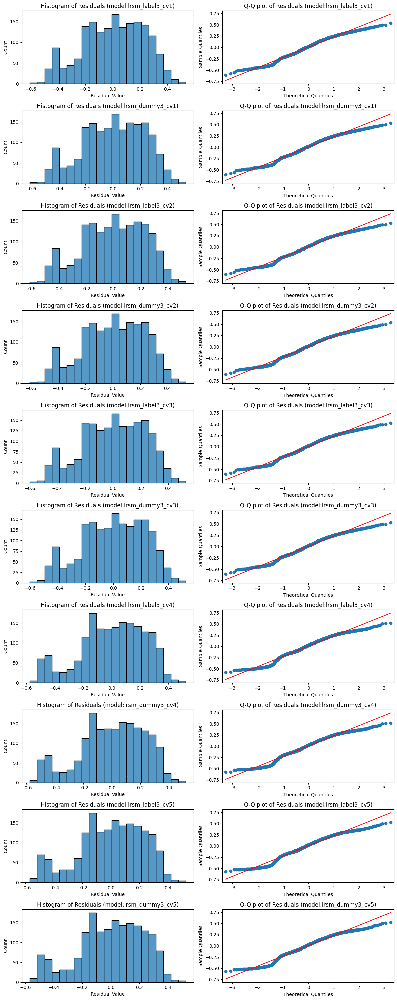

In [75]:
##################################################
#Normality
##################################################
colNm=2
rowNum=len(lrsm_cv_list)

fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))
for row in range(len(lrsm_cv_list)):
    # Calculate the residuals.
    model=lrsm_cv_list[row]
    model_name= lrsm_model_name_list[row]
    
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    X_val_scaled,y_val,y_val_preds=get_scaled_val_data(model,'lrsm',model_name,select_col)
    residuals = y_val-y_val_preds
    # Create a histogram with the residuals. 
    sns.histplot(residuals, ax=axs[row][0])


    # Set the x label of the residual plot.
    axs[row][0].set_xlabel("Residual Value")

    # Set the title of the residual plot.
    axs[row][0].set_title(f"Histogram of Residuals (model:{model_name})")

    # Create a Q-Q plot of the residuals.
    sm.qqplot(residuals, line = 's',ax=axs[row][1])


    # Set the title of the Q-Q plot.
    axs[row][1].set_title(f"Q-Q plot of Residuals (model:{model_name})")


plt.tight_layout()

# Show the plot.
plt.show()

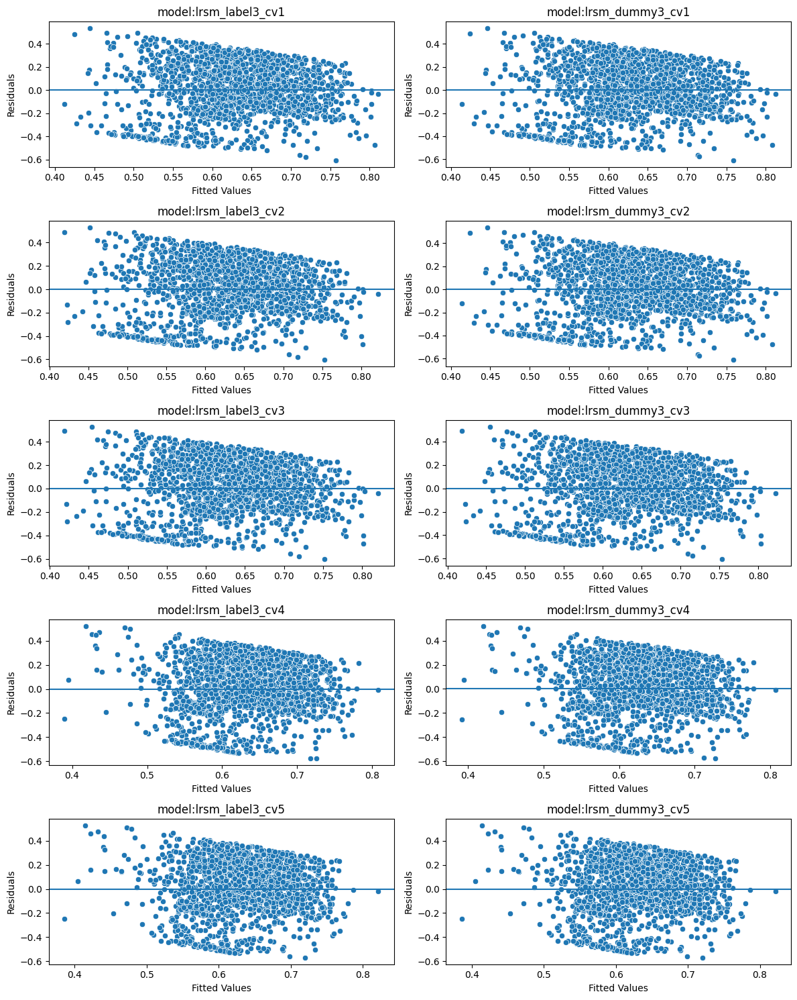

In [76]:
##################################################
#Linearity
##################################################
#Already confirmed

##################################################
#Independence
##################################################
#Need to confirm how data collected


##################################################
#Constant variance
##################################################
colNm=2
rowNum=np.ceil(len(lrsm_cv_list)/2).astype(int)
fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))

for row, ax in zip(range(len(lrsm_cv_list)),axs.ravel()):
    model=lrsm_cv_list[row]
    model_name= lrsm_model_name_list[row]
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    X_val_scaled,y_val,y_val_preds=get_scaled_val_data(model,'lrsm',model_name,select_col)
    residuals = y_val-y_val_preds
    fitted_values =model.get_prediction().predicted_mean
    sns.scatterplot(x=y_val_preds, y=residuals,ax=ax)
    ax.set_xlabel("Fitted Values")
    ax.set_ylabel("Residuals")
    ax.set_title(f"model:{model_name}")
    ax.axhline(0)

plt.tight_layout()
#=>None of them meet homoscedasticity assumptions

### [Decision Tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html#sklearn.tree.DecisionTreeRegressor)

In [77]:
RANDOM_STATE=0
dt = DecisionTreeRegressor(random_state = RANDOM_STATE)

dt_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
    },
]

dt_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
    },
]

In [78]:
def dt_grid_fit(target_index:int,
                feature_index:int,
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                dt_regressor, 
                cv=5,
                refit='r2',
                score=['r2', 'neg_mean_absolute_error','neg_mean_squared_error']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            dt_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_dt
    
    pickle_filenm=f'dt_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'

    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(dt_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=dt_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        dt_label_cv = GridSearchCV(dt_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        dt_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, dt_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(dt_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=dt_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)

        #Instantiate the GridSearchCV object
        dt_dummy_cv = GridSearchCV(dt_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        dt_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, dt_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def dt_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    dt_cv_list=[]
    dt_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'dt_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            dt=read_pickle(path, saved_model_name)
                            dt_model_name_list.append(saved_model_name)
                            dt_cv_list.append(dt)  
    return dt_cv_list,dt_model_name_list

In [79]:
####################################################
#target_index:[3]
#feature_index:[1,2,3,4,5,6,7,8,9,10]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[3]
feature_index_list=[1,2,3,4,5,6,7,8,9,10]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                dt_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', dt_regressor=dt,cv=5, refit='r2')
                dt_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', dt_regressor=dt,cv=5, refit='r2')

2025-04-19 03:46:49.572771: Fit Start
**************Fit parameters******************
select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD', 'department_trans_accounting', 'department_trans_hr', 'department_trans_management', 'department_trans_marketing', 'department_trans_product_mng', 'department_trans_sales', 'department_trans_support', 'department_trans_technical', 'salary', 'emp_type']
select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD', 'department_trans_accounting', 'department_trans_hr', 'department_trans_management', 'department_trans_marketing', 'department_trans_product_mng', 'department_trans_sales', 'department_trans_support', 'department_trans_technical', 'salary', 'emp_type']
hyp_params:  {'max_depth': 

In [80]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
target_len=len(depedent_variables)
feature_len=len(select_col_list)
#feature_len=1
hyp_len=max(len(dt_cv_label_params_list),len(dt_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
dt_cv_list,dt_model_name_list=dt_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_dt)

In [81]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
dt_best_hyperparameters=pd.DataFrame()
for index in range(len(dt_cv_list)):
    dt_row=dt_cv_list[index].best_params_
    dt_row['dt Model name']=dt_model_name_list[index]
    df_dictionary = pd.DataFrame([dt_row])
    dt_best_hyperparameters = pd.concat([dt_best_hyperparameters, df_dictionary], ignore_index=True)

dt_best_hyperparameters.to_csv('dt_best_hyperparameters.csv', index=False)
dt_best_hyperparameters

,max_depth,max_features,min_samples_leaf,min_samples_split,dt Model name
0,5,0.8,1,2,dt_dummy3_cv1_hyp1_gs1
1,5,0.8,1,2,dt_label3_cv1_hyp1_gs1
2,5,0.8,1,2,dt_dummy3_cv2_hyp1_gs1
3,5,0.8,1,2,dt_label3_cv2_hyp1_gs1
4,5,0.6,1,2,dt_dummy3_cv3_hyp1_gs1
5,5,0.9,1,2,dt_label3_cv3_hyp1_gs1
6,7,0.7,1,2,dt_dummy3_cv4_hyp1_gs1
7,7,0.9,1,2,dt_label3_cv4_hyp1_gs1
8,7,0.9,1,2,dt_dummy3_cv5_hyp1_gs1
9,7,0.9,1,2,dt_label3_cv5_hyp1_gs1


In [82]:
###################################################
#Training Results
###################################################
dt_train_score_list=[]
for dt_cv, index in zip(dt_cv_list, range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        dt_preds=dt_best.predict(X_dummy_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(dt_model_name_list[index], dt_preds, y_dummy_train,num_params)
    elif 'dt_label' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        dt_preds=dt_best.predict(X_label_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(dt_model_name_list[index], dt_preds, y_label_train,num_params)
    
    dt_train_score_list.append(train_score)

dt_train_score=pd.concat(dt_train_score_list).reset_index(drop=True)
dt_train_score.to_csv('dt_train_score.csv', index=False)
dt_train_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,dt_dummy3_cv1_hyp1_gs1,0.372893,0.371144,0.036848,0.148609,-3289.390390,-3144.889335
1,dt_label3_cv1_hyp1_gs1,0.370366,0.368875,0.036996,0.149677,-3266.466478,-3142.608431
2,dt_dummy3_cv2_hyp1_gs1,0.372893,0.371144,0.036848,0.148609,-3289.390390,-3144.889335
3,dt_label3_cv2_hyp1_gs1,0.368530,0.367826,0.037104,0.149828,-3263.510751,-3201.581728
4,dt_dummy3_cv3_hyp1_gs1,0.353401,0.352501,0.037993,0.152272,-3089.194478,-3013.503449
5,dt_label3_cv3_hyp1_gs1,0.367698,0.367083,0.037153,0.149372,-3256.049143,-3201.001122
6,dt_dummy3_cv4_hyp1_gs1,0.300302,0.299425,0.041113,0.160081,-2523.422675,-2454.612649
7,dt_label3_cv4_hyp1_gs1,0.333335,0.332779,0.039172,0.155195,-2877.336538,-2829.169520
8,dt_dummy3_cv5_hyp1_gs1,0.335476,0.334921,0.039046,0.155199,-2900.472293,-2852.305274
9,dt_label3_cv5_hyp1_gs1,0.321081,0.320609,0.039892,0.157180,-2748.300722,-2707.014707


In [83]:
###################################################
#Validation Results
###################################################
dt_val_score_list=[]
for dt_cv, index in zip(dt_cv_list, range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    
    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        dt_preds=dt_best.predict(X_dummy_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(dt_model_name_list[index], dt_preds, y_dummy_val,num_params)
        
    elif 'dt_label' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        dt_preds=dt_best.predict(X_label_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(dt_model_name_list[index], dt_preds, y_label_val,num_params)
    
    dt_val_score_list.append(val_score)

dt_val_score=pd.concat(dt_val_score_list).reset_index(drop=True)
dt_val_score.to_csv('dt_val_score.csv', index=False)
dt_val_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,dt_dummy3_cv1_hyp1_gs1,0.383136,0.376198,0.034565,0.143651,-906.143719,-790.749008
1,dt_label3_cv1_hyp1_gs1,0.368514,0.362487,0.035384,0.144772,-869.998044,-771.088292
2,dt_dummy3_cv2_hyp1_gs1,0.383136,0.376198,0.034565,0.143651,-906.143719,-790.749008
3,dt_label3_cv2_hyp1_gs1,0.369883,0.367067,0.035308,0.145279,-891.901049,-842.446173
4,dt_dummy3_cv3_hyp1_gs1,0.354245,0.350633,0.036184,0.148444,-843.798483,-783.353635
5,dt_label3_cv3_hyp1_gs1,0.361340,0.358844,0.035786,0.145415,-869.674566,-825.714676
6,dt_dummy3_cv4_hyp1_gs1,0.254833,0.251084,0.041754,0.161091,-588.203807,-533.253945
7,dt_label3_cv4_hyp1_gs1,0.290875,0.288501,0.039735,0.155808,-683.393101,-644.928198
8,dt_dummy3_cv5_hyp1_gs1,0.286382,0.283992,0.039986,0.156990,-672.028876,-633.563972
9,dt_label3_cv5_hyp1_gs1,0.285343,0.283350,0.040045,0.157135,-671.413030,-638.443112


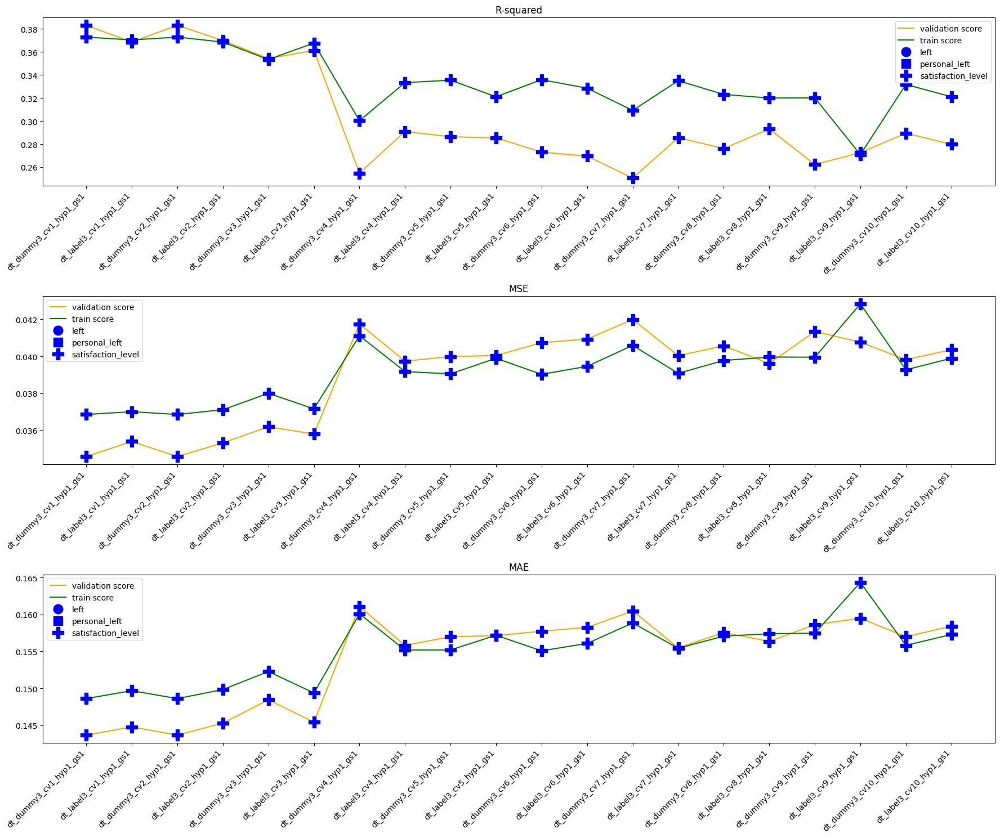

In [84]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(3, 1, figsize=(18,15))

metrics=['R-squared','MSE', 'MAE']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(dt_val_score['model'], dt_val_score[metric], color='orange', label='validation score')
    ax.plot(dt_train_score['model'], dt_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
        #satisfaction_level
        '_dummy3_|_label3_',
    ]
    marker_list=['bo','bs','bP','b*','bD']
    markersize_list=[12,12,15,16,10]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(dt_val_score[dt_val_score['model'].str.contains(substr)]['model'], dt_val_score[dt_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(dt_train_score[dt_train_score['model'].str.contains(substr)]['model'], dt_train_score[dt_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

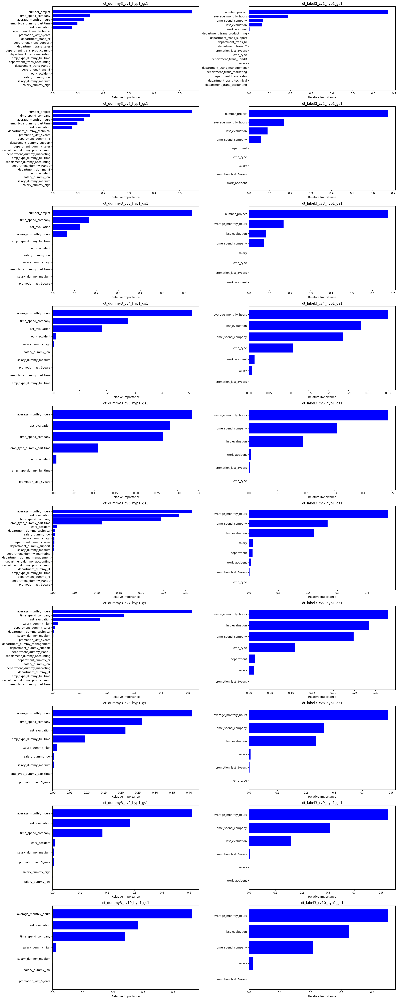

In [85]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(dt_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for dt_cv, ax, index in zip(dt_cv_list, axes.flatten(), range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    importances = dt_best.feature_importances_

    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'dt_label' in dt_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=20:
        num_features = 20
    else:
        num_features =len(importances)

    ax.set_title(dt_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

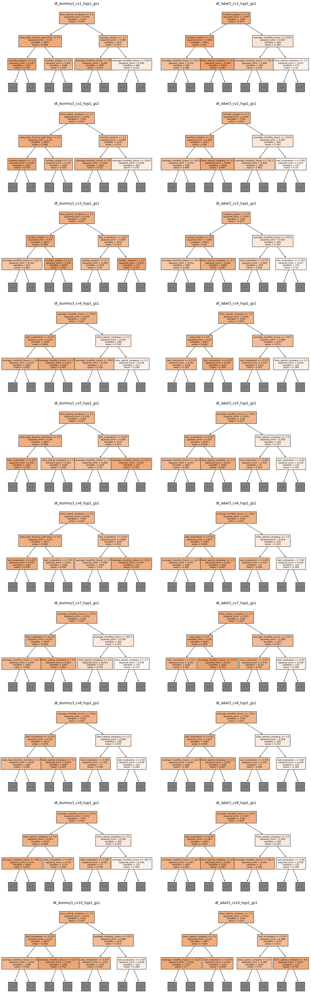

In [86]:
#############################################################
#Plot the "best" decision tree
#############################################################
rowCount=math.ceil(len(dt_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(16,rowCount*5))
for dt_cv, ax, index in zip(dt_cv_list, axes.flatten(), range(len(dt_cv_list))):
    best_tree=dt_cv.best_estimator_
    
    #pickle file dt_[dummy|label][1|2]_cvXX XX was index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    if 'dt_dummy' in dt_model_name_list[index]:
        target_variable_cnt=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_variable_cnt]
        
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        
        plot_tree(best_tree, max_depth=2, fontsize=8, feature_names=select_feature, 
          filled=True, ax=ax)
    elif 'dt_label' in dt_model_name_list[index]:
        target_variable_cnt=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_val=X_label_val_list[target_variable_cnt]
        
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        
        plot_tree(best_tree, max_depth=2, fontsize=8, feature_names=select_feature, 
          filled=True, ax=ax)
    ax.set_title(dt_model_name_list[index])
        
plt.tight_layout()
plt.show()

### [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

In [87]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################

import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/'
destination = path_rf

# gather all files
allfiles = glob.glob(os.path.join(source, 'rf_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_dummy3_cv7_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy3_cv7_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_dummy3_cv5_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy3_cv5_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_label3_cv10_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_label3_cv10_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_dummy3_cv4_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy3_cv4_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_dummy3_cv6_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy3_cv6_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/rf_pickle/rf_label3_cv6_hyp1_gs1.pickle -> /kag

In [88]:
select_index=1
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')

print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_trans_IT', 'department_trans_RandD', 'department_trans_accounting', 'department_trans_hr', 'department_trans_management', 'department_trans_marketing', 'department_trans_product_mng', 'department_trans_sales', 'department_trans_support', 'department_trans_technical', 'salary', 'emp_type']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,4.582576,3.044522,4.2,6.3,8.4,10.5,14.7,18.9,21,4.242641,2.890372,5.4,9.0,12.6,16.2,18


In [89]:
rf = RandomForestRegressor(random_state=RANDOM_STATE)

rf_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 100,120, 140,160],
    },
]

rf_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.3,0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 100,120, 140,160],
    },
]

In [90]:
#https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html
def rf_grid_fit(target_index:int,
                feature_index:int, 
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                rf_regressor, 
                cv=5,
                refit='r2',
                score=['r2', 'neg_mean_absolute_error','neg_mean_squared_error']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            rf_regressor(RandomForestRegressor):RandomForestRegressor
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_rf
    
    pickle_filenm=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'

    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(rf_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=rf_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        rf_label_cv = GridSearchCV(rf_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        rf_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, rf_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(rf_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=rf_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)

        #Instantiate the GridSearchCV object
        rf_dummy_cv = GridSearchCV(rf_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        rf_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, rf_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def rf_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    rf_cv_list=[]
    rf_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            rf=read_pickle(path, saved_model_name)
                            rf_model_name_list.append(saved_model_name)
                            rf_cv_list.append(rf)  
    return rf_cv_list,rf_model_name_list

#### Fit model

In [91]:
%%script True
####################################################
#target_index:[3]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[3]
feature_index_list=[2]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_regressor=rf,cv=5, refit='r2')
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_regressor=rf,cv=5, refit='r2')

#2025-03-27 07:52:09.602568: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 100, 120, 140, 160]}
#encoding_type:  label
#cv:  5
#refit:  r2
#pickle file name:  rf_label3_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-27 08:02:52.130729: Fit End
#Fit duration: 10 min 42 s
#2025-03-27 08:02:52.138935: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 100, 120, 140, 160]}
#encoding_type:  dummy
#cv:  5
#refit:  r2
#pickle file name:  rf_dummy3_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-27 08:16:16.323325: Fit End
#Fit duration: 13 min 24 s

Couldn't find program: 'True'


In [92]:
%%script True
####################################################
#target_index:[3]
#feature_index:[3,4,5,6,7,8,9,10]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[3]
feature_index_list=[3,4,5,6,7,8,9,10]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_regressor=rf,cv=5, refit='r2')
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_regressor=rf,cv=5, refit='r2')


Couldn't find program: 'True'


In [93]:
###################################################
#Read from pickle
###################################################

target_len=len(depedent_variables)
feature_len=len(select_col_list)
hyp_len=max(len(rf_cv_label_params_list),len(rf_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
rf_cv_list,rf_model_name_list=rf_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_rf)

In [94]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
rf_best_hyperparameters=pd.DataFrame()
for index in range(len(rf_cv_list)):
    rf_row_org=rf_cv_list[index].best_params_
    #remove randomforestclassifier__ in resampled model
    rf_row = {k.replace('randomforestclassifier__',''):v for k,v in rf_row_org.items()}
    rf_row['RF Model name']=rf_model_name_list[index]
    df_dictionary = pd.DataFrame([rf_row])
    rf_best_hyperparameters = pd.concat([rf_best_hyperparameters, df_dictionary], ignore_index=True)

rf_best_hyperparameters.to_csv('rf_best_hyperparameters.csv', index=False)
rf_best_hyperparameters

,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name
0,9,0.6,0.9,1,2,160,rf_dummy3_cv2_hyp1_gs1
1,11,0.8,0.3,1,2,120,rf_label3_cv2_hyp1_gs1
2,11,0.8,0.3,1,2,160,rf_dummy3_cv3_hyp1_gs1
3,11,0.8,0.3,1,2,140,rf_label3_cv3_hyp1_gs1
4,9,0.9,0.5,1,2,160,rf_dummy3_cv4_hyp1_gs1
5,9,0.9,0.7,1,2,140,rf_label3_cv4_hyp1_gs1
6,9,0.8,0.5,1,2,140,rf_dummy3_cv5_hyp1_gs1
7,9,0.7,0.5,1,2,160,rf_label3_cv5_hyp1_gs1
8,9,0.9,0.7,1,2,100,rf_dummy3_cv6_hyp1_gs1
9,9,0.9,0.5,1,2,120,rf_label3_cv6_hyp1_gs1


In [95]:
###################################################
#Training Results
###################################################
rf_train_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_dummy_train,num_params)
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        rf_preds=rf_best.predict(X_label_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_label_train,num_params)
    
    rf_train_score_list.append(train_score)

rf_train_score=pd.concat(rf_train_score_list).reset_index(drop=True)
rf_train_score.to_csv('rf_train_score.csv', index=False)
rf_train_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_dummy3_cv2_hyp1_gs1,0.486972,0.485541,0.030145,0.135385,-4733.852902,-4589.351847
1,rf_label3_cv2_hyp1_gs1,0.494723,0.494160,0.029689,0.134932,-4867.369979,-4805.440955
2,rf_dummy3_cv3_hyp1_gs1,0.491982,0.491275,0.029850,0.135179,-4824.454935,-4748.763906
3,rf_label3_cv3_hyp1_gs1,0.493526,0.493033,0.029760,0.135134,-4852.348685,-4797.300664
4,rf_dummy3_cv4_hyp1_gs1,0.398146,0.397392,0.035364,0.149423,-3607.083269,-3538.273242
5,rf_label3_cv4_hyp1_gs1,0.405963,0.405467,0.034905,0.148178,-3707.134034,-3658.967016
6,rf_dummy3_cv5_hyp1_gs1,0.389311,0.388801,0.035883,0.150530,-3508.245748,-3460.078730
7,rf_label3_cv5_hyp1_gs1,0.389108,0.388683,0.035895,0.150817,-3507.856444,-3466.570428
8,rf_dummy3_cv6_hyp1_gs1,0.412787,0.411232,0.034504,0.147531,-3764.252146,-3626.632094
9,rf_label3_cv6_hyp1_gs1,0.404013,0.403432,0.035019,0.148844,-3681.551522,-3626.503501


In [96]:
###################################################
#Validation Results
###################################################
rf_val_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_dummy_val,num_params)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        rf_preds=rf_best.predict(X_label_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_label_val,num_params)
    
    rf_val_score_list.append(val_score)

rf_val_score=pd.concat(rf_val_score_list).reset_index(drop=True)
rf_val_score.to_csv('rf_val_score.csv', index=False)
rf_val_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_dummy3_cv2_hyp1_gs1,0.403733,0.397026,0.033411,0.141295,-967.237000,-851.842289
1,rf_label3_cv2_hyp1_gs1,0.400111,0.397430,0.033614,0.142045,-980.340394,-930.885517
2,rf_dummy3_cv3_hyp1_gs1,0.405405,0.402080,0.033317,0.141392,-992.289586,-931.844737
3,rf_label3_cv3_hyp1_gs1,0.403425,0.401093,0.033428,0.141582,-992.306582,-948.346692
4,rf_dummy3_cv4_hyp1_gs1,0.322125,0.318715,0.037984,0.154819,-758.471292,-703.521430
5,rf_label3_cv4_hyp1_gs1,0.323191,0.320925,0.037924,0.154431,-767.301632,-728.836728
6,rf_dummy3_cv5_hyp1_gs1,0.318357,0.316074,0.038195,0.155294,-754.497659,-716.032755
7,rf_label3_cv5_hyp1_gs1,0.319591,0.317694,0.038126,0.155184,-759.758459,-726.788542
8,rf_dummy3_cv6_hyp1_gs1,0.327085,0.319898,0.037706,0.154441,-751.682559,-641.782834
9,rf_label3_cv6_hyp1_gs1,0.320953,0.318299,0.038049,0.155228,-759.362749,-715.402859


In [97]:

rf_val_score[rf_val_score['model'].str.contains('label')]

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
1,rf_label3_cv2_hyp1_gs1,0.400111,0.397430,0.033614,0.142045,-980.340394,-930.885517
3,rf_label3_cv3_hyp1_gs1,0.403425,0.401093,0.033428,0.141582,-992.306582,-948.346692
5,rf_label3_cv4_hyp1_gs1,0.323191,0.320925,0.037924,0.154431,-767.301632,-728.836728
7,rf_label3_cv5_hyp1_gs1,0.319591,0.317694,0.038126,0.155184,-759.758459,-726.788542
9,rf_label3_cv6_hyp1_gs1,0.320953,0.318299,0.038049,0.155228,-759.362749,-715.402859
11,rf_label3_cv7_hyp1_gs1,0.316757,0.314469,0.038284,0.155376,-750.279971,-711.815067
13,rf_label3_cv8_hyp1_gs1,0.317107,0.315202,0.038265,0.155219,-753.202301,-720.232384
15,rf_label3_cv9_hyp1_gs1,0.320749,0.318855,0.038061,0.155204,-762.822176,-729.852259
17,rf_label3_cv10_hyp1_gs1,0.318733,0.317214,0.038174,0.155170,-759.492748,-732.017817


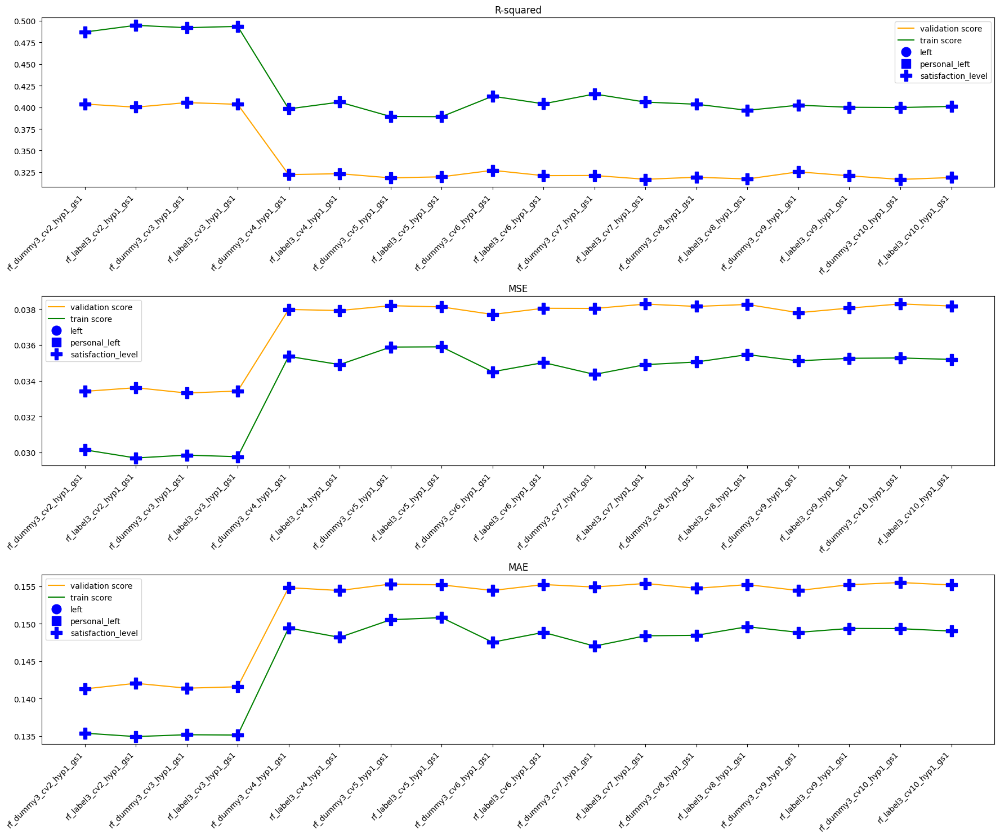

In [98]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(3, 1, figsize=(18,15))

metrics=['R-squared','MSE', 'MAE']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(rf_val_score['model'], rf_val_score[metric], color='orange', label='validation score')
    ax.plot(rf_train_score['model'], rf_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
        #satisfaction_level
        '_dummy3_|_label3_',
    ]
    marker_list=['bo','bs','bP','b*','bD']
    markersize_list=[12,12,15,16,10]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

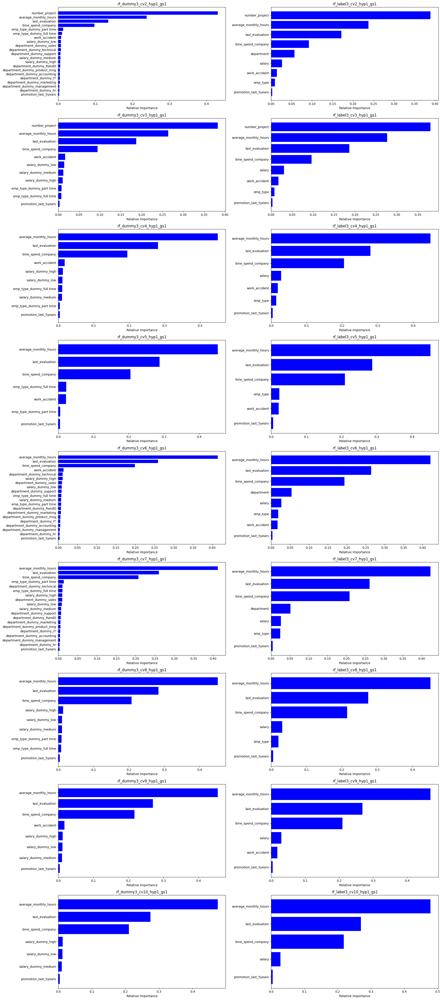

In [99]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    if type(rf_best)==Pipeline:
        importances=rf_best.named_steps["randomforestclassifier"].feature_importances_
    else:
        importances = rf_best.feature_importances_

    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)

    # customized number
    if len(importances)>=25:
        num_features = 25
    else:
        num_features =len(importances)

    ax.set_title(rf_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_xlabel('Relative Importance')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

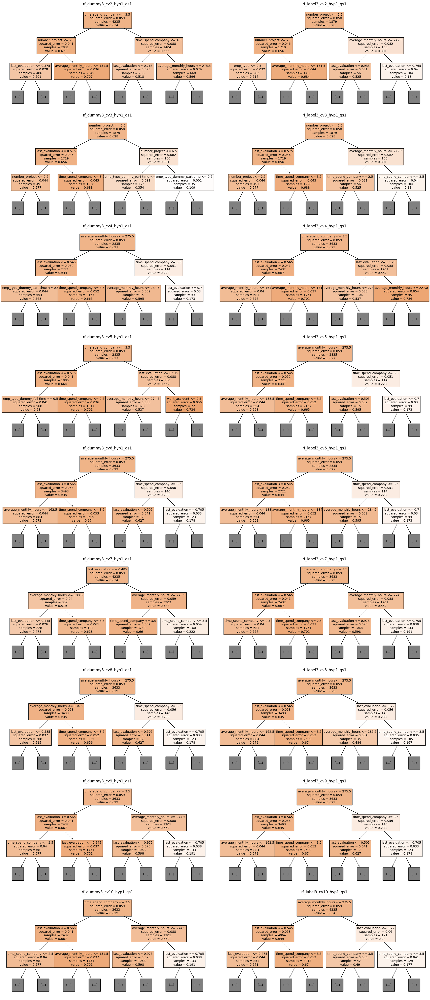

In [100]:
#############################################################
#Plot tree
#############################################################
from sklearn import tree

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    if type(rf_best)==Pipeline:
        rf_best=rf_best.named_steps["randomforestclassifier"]
    importances = rf_best.feature_importances_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')
    
    tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=2,
                   fontsize=10,
                   ax = ax)
        
    ax.set_title(rf_model_name_list[index])

plt.tight_layout()
plt.show()

### [XGBoost](https://xgboost.readthedocs.io/en/stable/parameter.html)

In [101]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################
import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/'
destination = path_xgb

# gather all files
allfiles = glob.glob(os.path.join(source, 'xgb_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_label3_cv9_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label3_cv9_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_dummy3_cv8_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy3_cv8_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_dummy3_cv5_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy3_cv5_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_label3_cv10_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label3_cv10_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_label3_cv2_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label3_cv2_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/regression/xgb_pickle/xgb_dummy3_cv10_

In [102]:
select_index=2
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')

print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,4.582576,3.044522,4.2,6.3,8.4,10.5,14.7,18.9,21,3.0,2.197225,2.7,4.5,6.3,8.1,9


In [103]:
xgb = XGBRegressor(objective='reg:squarederror', random_state=RANDOM_STATE) 

xgb_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1,0.2, 0.3],
     'n_estimators': [80, 100,120, 140,160],
     'subsample':[0.3,0.5,0.7, 0.9],
     'colsample_bytree':[0.3,0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
     },
]



xgb_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11],
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 100,120, 140,160],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.3,0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
     },
]

In [104]:
def xgb_grid_fit(target_index:int,
                feature_index:int, 
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                xgb_regressor, 
                cv=5,
                refit='r2',
                score=['r2', 'neg_mean_absolute_error','neg_mean_squared_error']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            xgb_regressor(XGBRegressor):XGBRegressor
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_xgb
    
    pickle_filenm=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'

    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(xgb_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        xgb_label_cv = GridSearchCV(xgb_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        xgb_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, xgb_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(xgb_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)

        #Instantiate the GridSearchCV object
        xgb_dummy_cv = GridSearchCV(xgb_regressor, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        xgb_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, xgb_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def xgb_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    xgb_cv_list=[]
    xgb_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            xgb=read_pickle(path, saved_model_name)
                            xgb_model_name_list.append(saved_model_name)
                            xgb_cv_list.append(xgb)  
    return xgb_cv_list,xgb_model_name_list

In [105]:
%%script True
####################################################
#target_index:[3]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[3]
feature_index_list=[2]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_regressor=xgb,cv=5, refit='r2')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_regressor=xgb,cv=5, refit='r2')

#2025-03-27 09:35:55.352249: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 100, 120, 140, 1600], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}
#encoding_type:  label
#cv:  5
#refit:  r2
#pickle file name:  xgb_label3_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-27 10:18:16.359815: Fit End
#Fit duration: 42 min 21 s
#2025-03-27 10:18:16.361305: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 100, 120, 140, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}
#encoding_type:  dummy
#cv:  5
#refit:  r2
#pickle file name:  xgb_dummy3_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-27 10:35:59.108747: Fit End
#Fit duration: 17 min 42 s

Couldn't find program: 'True'


In [106]:
%%script True
####################################################
#target_index:[3]
#feature_index:[3,4,5,6,7,8,9,10]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[3]
feature_index_list=[3,4,5,6,7,8,9,10]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_regressor=xgb,cv=5, refit='r2')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_regressor=xgb,cv=5, refit='r2')


Couldn't find program: 'True'


In [107]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
feature_len=len(select_col_list)
hyp_len=max(len(xgb_cv_label_params_list),len(xgb_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
xgb_cv_list,xgb_model_name_list=xgb_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_xgb)

In [108]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
xgb_best_hyperparameters=pd.DataFrame()
for index in range(len(xgb_cv_list)):
    xgb_row=xgb_cv_list[index].best_params_
    xgb_row['xgb Model name']=xgb_model_name_list[index]
    df_dictionary = pd.DataFrame([xgb_row])
    xgb_best_hyperparameters = pd.concat([xgb_best_hyperparameters, df_dictionary], ignore_index=True)

xgb_best_hyperparameters.to_csv('xgb_best_hyperparameters.csv', index=False)
xgb_best_hyperparameters

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,subsample,xgb Model name
0,0.8,0.1,5,1,80,0.9,xgb_dummy3_cv2_hyp1_gs1
1,0.9,0.1,5,1,80,0.9,xgb_label3_cv2_hyp1_gs1
2,0.8,0.1,5,1,80,0.9,xgb_dummy3_cv3_hyp1_gs1
3,0.9,0.1,5,1,80,0.7,xgb_label3_cv3_hyp1_gs1
4,0.9,0.1,5,1,80,0.9,xgb_dummy3_cv4_hyp1_gs1
5,0.9,0.1,5,1,80,0.7,xgb_label3_cv4_hyp1_gs1
6,0.9,0.1,5,1,80,0.9,xgb_dummy3_cv5_hyp1_gs1
7,0.9,0.1,5,1,80,0.9,xgb_label3_cv5_hyp1_gs1
8,0.9,0.1,5,1,80,0.9,xgb_dummy3_cv6_hyp1_gs1
9,0.9,0.1,5,1,80,0.9,xgb_label3_cv6_hyp1_gs1


In [109]:
###################################################
#Training Results
###################################################
xgb_train_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_dummy_train,num_params)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        xgb_preds=xgb_best.predict(X_label_train[select_feature])
        num_params=len(select_feature)
        train_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_label_train,num_params)
    
    xgb_train_score_list.append(train_score)

xgb_train_score=pd.concat(xgb_train_score_list).reset_index(drop=True)
xgb_train_score.to_csv('xgb_train_score.csv', index=False)
xgb_train_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,xgb_dummy3_cv2_hyp1_gs1,0.475516,0.474054,0.030818,0.137282,-4574.980468,-4430.479413
1,xgb_label3_cv2_hyp1_gs1,0.483459,0.482883,0.030351,0.135920,-4708.755039,-4646.826015
2,xgb_dummy3_cv3_hyp1_gs1,0.465769,0.465025,0.031391,0.138589,-4462.510742,-4386.819713
3,xgb_label3_cv3_hyp1_gs1,0.476625,0.476116,0.030753,0.137050,-4616.211267,-4561.163247
4,xgb_dummy3_cv4_hyp1_gs1,0.383669,0.382897,0.036215,0.151783,-3436.083448,-3367.273421
5,xgb_label3_cv4_hyp1_gs1,0.379101,0.378583,0.036483,0.152401,-3388.963657,-3340.796638
6,xgb_dummy3_cv5_hyp1_gs1,0.376888,0.376368,0.036613,0.152931,-3363.370708,-3315.203690
7,xgb_label3_cv5_hyp1_gs1,0.380421,0.379990,0.036406,0.152359,-3406.276110,-3364.990095
8,xgb_dummy3_cv6_hyp1_gs1,0.389801,0.388185,0.035854,0.151217,-3488.020090,-3350.400038
9,xgb_label3_cv6_hyp1_gs1,0.387355,0.386758,0.035998,0.151301,-3483.242497,-3428.194476


In [110]:
###################################################
#Validation Results
###################################################
xgb_val_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        #drop na in validation or test set
        X_val=X_dummy_val[select_feature].copy()
        X_val=X_val.dropna()
        y_val=y_dummy_val.loc[X_val.index]
        xgb_preds=xgb_best.predict(X_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_val,num_params)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        #drop na in validation or test set
        X_val=X_label_val[select_feature].copy()
        X_val=X_val.dropna()
        y_val=y_label_val.loc[X_val.index]
        xgb_preds=xgb_best.predict(X_val[select_feature])
        num_params=len(select_feature)
        val_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_val,num_params)
    
    xgb_val_score_list.append(val_score)

xgb_val_score=pd.concat(xgb_val_score_list).reset_index(drop=True)
xgb_val_score.to_csv('xgb_val_score.csv', index=False)
xgb_val_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,xgb_dummy3_cv2_hyp1_gs1,0.400011,0.393262,0.033619,0.142411,-956.041999,-840.647288
1,xgb_label3_cv2_hyp1_gs1,0.395952,0.393252,0.033847,0.142267,-967.911321,-918.456445
2,xgb_dummy3_cv3_hyp1_gs1,0.394189,0.390801,0.033946,0.143462,-958.670012,-898.225164
3,xgb_label3_cv3_hyp1_gs1,0.393918,0.391549,0.033961,0.143137,-963.865676,-919.905786
4,xgb_dummy3_cv4_hyp1_gs1,0.316548,0.313110,0.038296,0.156136,-743.731777,-688.781915
5,xgb_label3_cv4_hyp1_gs1,0.309463,0.307151,0.038693,0.157628,-731.178083,-692.713179
6,xgb_dummy3_cv5_hyp1_gs1,0.313592,0.311294,0.038462,0.156812,-741.968088,-703.503184
7,xgb_label3_cv5_hyp1_gs1,0.320507,0.318612,0.038074,0.156296,-762.181834,-729.211916
8,xgb_dummy3_cv6_hyp1_gs1,0.319397,0.312128,0.038136,0.156363,-731.245305,-621.345581
9,xgb_label3_cv6_hyp1_gs1,0.313811,0.311129,0.038449,0.157056,-740.540618,-696.580728


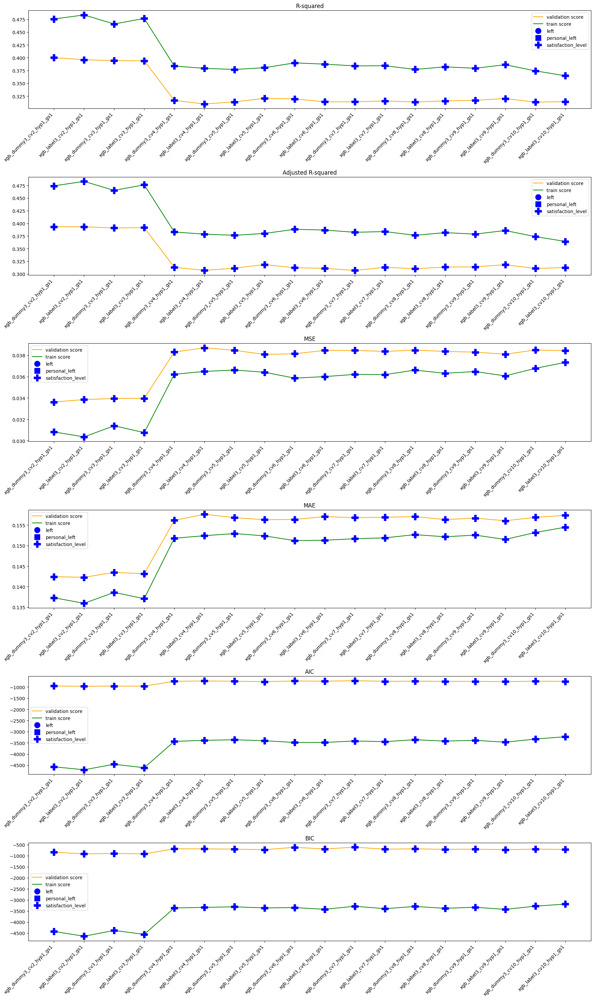

In [111]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(6, 1, figsize=(18,30))

metrics=['R-squared','Adjusted R-squared','MSE', 'MAE','AIC','BIC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(xgb_val_score['model'], xgb_val_score[metric], color='orange', label='validation score')
    ax.plot(xgb_train_score['model'], xgb_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
        #satisfaction_level
        '_dummy3_|_label3_',
    ]
    marker_list=['bo','bs','bP','b*','bD']
    markersize_list=[12,12,15,16,10]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

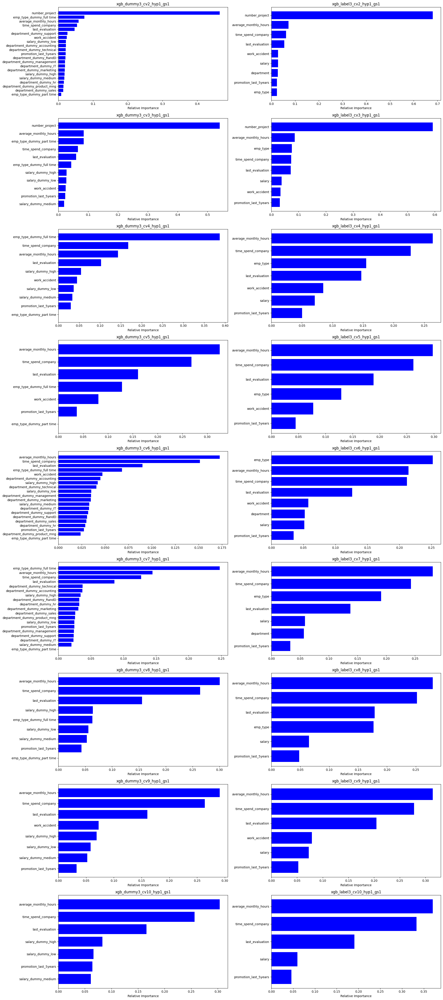

In [112]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(xgb_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    importances = xgb_best.feature_importances_

    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'xgb_label' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=25:
        num_features = 25
    else:
        num_features =len(importances)

    ax.set_title(xgb_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')

plt.tight_layout()
plt.show()

#### Compare score on all models

In [113]:
#Merge all train results(linear regression didn't meet assumptions, exclude linear regression)
allmodel_train_score=pd.concat([rf_train_score,xgb_train_score,dt_train_score]).reset_index(drop=True)

#Merge all validation results
allmodel_val_score=pd.concat([rf_val_score,xgb_val_score,dt_val_score]).reset_index(drop=True)

#allmodel_val_score.to_csv('allmodel_val_score.csv', index=False)
display(allmodel_train_score.head())
display(allmodel_val_score.head())

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_dummy3_cv2_hyp1_gs1,0.486972,0.485541,0.030145,0.135385,-4733.852902,-4589.351847
1,rf_label3_cv2_hyp1_gs1,0.494723,0.494160,0.029689,0.134932,-4867.369979,-4805.440955
2,rf_dummy3_cv3_hyp1_gs1,0.491982,0.491275,0.029850,0.135179,-4824.454935,-4748.763906
3,rf_label3_cv3_hyp1_gs1,0.493526,0.493033,0.029760,0.135134,-4852.348685,-4797.300664
4,rf_dummy3_cv4_hyp1_gs1,0.398146,0.397392,0.035364,0.149423,-3607.083269,-3538.273242


,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_dummy3_cv2_hyp1_gs1,0.403733,0.397026,0.033411,0.141295,-967.237000,-851.842289
1,rf_label3_cv2_hyp1_gs1,0.400111,0.397430,0.033614,0.142045,-980.340394,-930.885517
2,rf_dummy3_cv3_hyp1_gs1,0.405405,0.402080,0.033317,0.141392,-992.289586,-931.844737
3,rf_label3_cv3_hyp1_gs1,0.403425,0.401093,0.033428,0.141582,-992.306582,-948.346692
4,rf_dummy3_cv4_hyp1_gs1,0.322125,0.318715,0.037984,0.154819,-758.471292,-703.521430


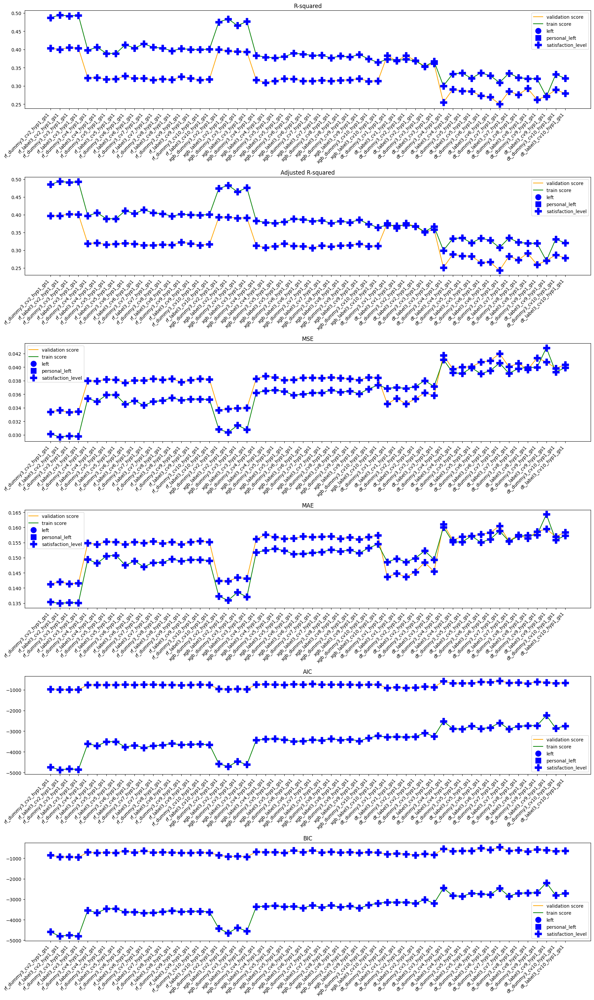

In [114]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(6, 1, figsize=(18,30))

metrics=['R-squared','Adjusted R-squared','MSE', 'MAE','AIC','BIC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(allmodel_val_score['model'], allmodel_val_score[metric], color='orange', label='validation score')
    ax.plot(allmodel_train_score['model'], allmodel_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
        #satisfaction_level
        '_dummy3_|_label3_',
    ]
    marker_list=['bo','bs','bP','b*','bD']
    markersize_list=[12,12,15,16,10]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(allmodel_val_score[allmodel_val_score['model'].str.contains(substr)]['model'], allmodel_val_score[allmodel_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(allmodel_train_score[allmodel_train_score['model'].str.contains(substr)]['model'], allmodel_train_score[allmodel_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

### Fit model with train and validation set

* Select champion model
* Fit all train and validation data
* Validate champion model on test set

### [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

In [115]:
#########################################################
#Champion model
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_label3_cv10_hyp1_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_
#remove randomforestclassifier__ in resampled model
best_params = {k.replace('randomforestregressor__',''):v for k,v in best_params.items()}

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_regressor_best = RandomForestRegressor(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    rf_regressor_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_regressor_best.predict(X_dummy_test[select_feature])
    num_params=len(select_feature)
    test_score=get_regression_scores(best_model_name, rf_preds, y_dummy_test,num_params)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    rf_regressor_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_regressor_best.predict(X_label_test[select_feature])
    num_params=len(select_feature)
    test_score=get_regression_scores(best_model_name, rf_preds, y_label_test,num_params)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='w')
rf_test_score

best hyperpatameters: {'max_depth': 9, 'max_features': 0.6, 'max_samples': 0.9, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 120}
best features: ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
best model name: rf_label3_cv10_hyp1_gs1


,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_label3_cv10_hyp1_gs1,0.272423,0.27145,0.042053,0.160774,-982.161804,-952.1333


In [116]:
###################################################
#After selecting champion models
#Just see all models
###################################################
rf_all_test_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_params=rf_cv.best_params_
    #remove randomforestregressor__ in resampled model
    rf_params = {k.replace('randomforestregressor__',''):v for k,v in rf_params.items()}
    if 'RF Model name' in rf_params:
        rf_params.pop('RF Model name')
    rf_regressor = RandomForestRegressor(**rf_params,
                                          random_state=RANDOM_STATE)
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        rf_regressor.fit(X_dummy_train_val[select_feature], y_dummy_train_val)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        rf_preds=rf_regressor.predict(X_dummy_test[select_feature])
        num_params=len(select_feature)
        test_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_dummy_test,num_params)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        rf_regressor.fit(X_label_train_val[select_feature], y_label_train_val)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        rf_preds=rf_regressor.predict(X_label_test[select_feature])
        num_params=len(select_feature)
        test_score=get_regression_scores(rf_model_name_list[index], rf_preds, y_label_test,num_params)
    
    rf_all_test_score_list.append(test_score)

rf_all_test_score=pd.concat(rf_all_test_score_list).reset_index(drop=True)
rf_all_test_score.to_csv('rf_all_test_score.csv', index=False)
rf_all_test_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,rf_dummy3_cv2_hyp1_gs1,0.367314,0.363064,0.036569,0.147213,-1369.121285,-1243.001571
1,rf_label3_cv2_hyp1_gs1,0.368901,0.367212,0.036477,0.147159,-1400.651846,-1346.600540
2,rf_dummy3_cv3_hyp1_gs1,0.366732,0.364612,0.036602,0.147299,-1386.363331,-1320.300624
3,rf_label3_cv3_hyp1_gs1,0.371795,0.370324,0.036310,0.146718,-1416.429403,-1368.383797
4,rf_dummy3_cv4_hyp1_gs1,0.271637,0.269444,0.042099,0.160434,-968.928032,-908.871025
5,rf_label3_cv4_hyp1_gs1,0.271301,0.269839,0.042118,0.160264,-973.543221,-931.503316
6,rf_dummy3_cv5_hyp1_gs1,0.273843,0.272386,0.041971,0.160657,-984.019782,-941.979878
7,rf_label3_cv5_hyp1_gs1,0.271775,0.270558,0.042091,0.161164,-977.492456,-941.458252
8,rf_dummy3_cv6_hyp1_gs1,0.270823,0.266171,0.042146,0.160283,-945.578056,-825.464043
9,rf_label3_cv6_hyp1_gs1,0.272969,0.271267,0.042022,0.160384,-978.412118,-930.366513


### [XGBoost](https://xgboost.readthedocs.io/en/stable/parameter.html)

In [117]:
%%script True
#########################################################
#Good model
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_dummy3_cv2_hyp1_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_
#remove xgbregressor__ in resampled model
best_params = {k.replace('xgbregressor__',''):v for k,v in best_params.items()}

best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_regressor_best = XGBRegressor(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    xgb_regressor_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    xgb_preds=xgb_regressor_best.predict(X_dummy_test[select_feature])
    num_params=len(select_feature)
    test_score=get_regression_scores(best_model_name, xgb_preds, y_dummy_test,num_params)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    xgb_regressor_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    xgb_preds=xgb_regressor_best.predict(X_label_test[select_feature])
    num_params=len(select_feature)
    test_score=get_regression_scores(best_model_name, xgb_preds, y_label_test,num_params)

xgb_test_score=pd.concat([test_score]).reset_index(drop=True)
xgb_test_score.to_csv('xgb_test_score.csv', index=False, mode='w')
xgb_test_score

Couldn't find program: 'True'


In [118]:
###################################################
#After selecting champion models
#Just see all models
###################################################
xgb_all_test_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_params=xgb_cv.best_params_
    #remove XGBRegressor__ in resampled model
    xgb_params = {k.replace('xgbregressor__',''):v for k,v in xgb_params.items()}
    if 'xgb Model name' in xgb_params:
        xgb_params.pop('xgb Model name')
    xgb_regressor = XGBRegressor(**xgb_params,
                                          random_state=RANDOM_STATE)
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        xgb_regressor.fit(X_dummy_train_val[select_feature], y_dummy_train_val)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        xgb_preds=xgb_regressor.predict(X_dummy_test[select_feature])
        num_params=len(select_feature)
        test_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_dummy_test,num_params)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        xgb_regressor.fit(X_label_train_val[select_feature], y_label_train_val)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        xgb_preds=xgb_regressor.predict(X_label_test[select_feature])
        num_params=len(select_feature)
        test_score=get_regression_scores(xgb_model_name_list[index], xgb_preds, y_label_test,num_params)
    
    xgb_all_test_score_list.append(test_score)

xgb_all_test_score=pd.concat(xgb_all_test_score_list).reset_index(drop=True)
xgb_all_test_score.to_csv('xgb_all_test_score.csv', index=False)
xgb_all_test_score

,model,R-squared,Adjusted R-squared,MSE,MAE,AIC,BIC
0,xgb_dummy3_cv2_hyp1_gs1,0.355710,0.351382,0.037239,0.148889,-1314.634653,-1188.514939
1,xgb_label3_cv2_hyp1_gs1,0.357743,0.356024,0.037122,0.147911,-1348.107422,-1294.056116
2,xgb_dummy3_cv3_hyp1_gs1,0.358132,0.355983,0.037099,0.148411,-1345.921656,-1279.858949
3,xgb_label3_cv3_hyp1_gs1,0.354562,0.353050,0.037306,0.148746,-1335.293459,-1287.247854
4,xgb_dummy3_cv4_hyp1_gs1,0.266386,0.264176,0.042402,0.162190,-947.390416,-887.333409
5,xgb_label3_cv4_hyp1_gs1,0.262256,0.260776,0.042641,0.162714,-936.559603,-894.519699
6,xgb_dummy3_cv5_hyp1_gs1,0.261760,0.260279,0.042670,0.163243,-934.544009,-892.504105
7,xgb_label3_cv5_hyp1_gs1,0.265669,0.264442,0.042444,0.162413,-952.463381,-916.429177
8,xgb_dummy3_cv6_hyp1_gs1,0.258035,0.253301,0.042885,0.163647,-893.453597,-773.339584
9,xgb_label3_cv6_hyp1_gs1,0.261688,0.259960,0.042674,0.163275,-932.253367,-884.207762


## Results

Please refer `salifort-motors-employee-leave-prediction.ipynb` for Conclusion and Recommendations

* When predict employee satisfaction level, number_project, average_monthly_hours, time_spend_company,  last_evaluation and time_spend_company were very important factors.
    * Champion model is `rf_label3_cv10_hyp1_gs1`, use `last_evaluation`, `average_monthly_hours`, `time_spend_company`, `promotion_last_5years`, `salary`
    * On test dataset, 27% of satisfaction level could be explained by this model, mean squared error is 0.04.
    * Champion model score 

|Score	|R-squared	|Adjusted R-squared	|MSE	    |MAE        |AIC|BIC|
|:-     |:-         |:-         |:-         |:-         |:- |:- |
|Train  |0.401014	|0.400681|0.035196	|0.149014   |-3651.452896|-3617.047883|
|Val    |0.318733	|0.317214|0.038174	|0.155170   |-759.492748|-732.017817|
|Test	|0.272423	|0.27145|0.042053	|0.160774   |-982.161804|-952.1333|



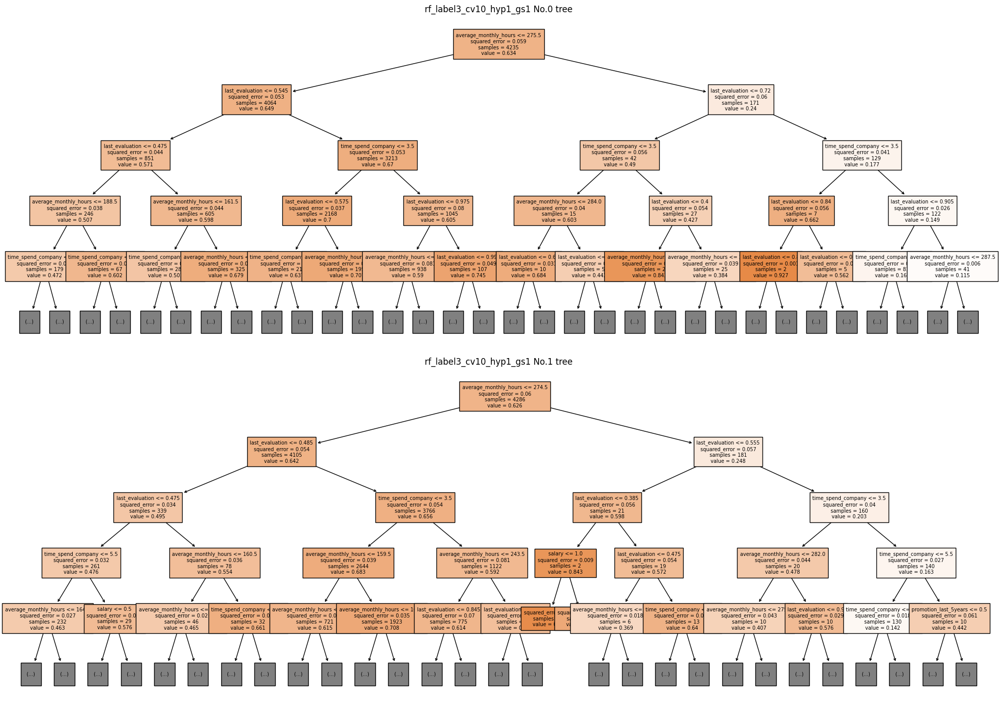

In [119]:
#############################################################
#Plot tree of champion model
#############################################################
from sklearn import tree

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,14))

champion_model_name='rf_label3_cv10_hyp1_gs1'
best_model_index=rf_model_name_list.index(champion_model_name)
#best_rf=rf_cv_list[best_model_index]
rf_best=rf_cv_list[best_model_index].best_estimator_

importances = rf_best.feature_importances_

params_index=find_number(champion_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

if '_dummy' in champion_model_name:
    features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
elif '_label' in champion_model_name:
     features=get_fit_features(select_col,X_label_val.columns,'label')

#plot the first tree
tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[0])
axes[0].set_title(f'{champion_model_name} No.0 tree')

#plot the second tree
tree.plot_tree(rf_best.estimators_[1],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=4,
                   fontsize=7,
                   ax = axes[1])
        
axes[1].set_title(f'{champion_model_name} No.1 tree')

plt.tight_layout()
plt.show()